<a href="https://colab.research.google.com/github/vanijain07/Cancer-Detection/blob/main/MLAssignment1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import random
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import math
from scipy.special import expit


Mounting drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Read and Split data

In [ ]:
data=pd.read_csv("/content/drive/MyDrive/ML Assignment 1/Data Set for Assignment 1.csv")

In [ ]:
def splitData(data):
  data1 = data.sample(frac=1,axis=1).reset_index(drop=True)
  x=int(0.67*len(data1))
  data_train=data1.iloc[:x,:]
  data_test=data1.iloc[x:,:]
  return data_train,data_test


In [ ]:
data_train,data_test=splitData(data)
#X_train=data_train.drop("diagnosis",axis=1)
#y_train=data_train["diagnosis"]
#X_test=data_test.drop("diagnosis",axis=1)
#y_test=data_test["diagnosis"]

Feature Engineering Task 1

In [ ]:
def replaceNull(data):
    for i in data.columns:
        if(i=='id' or i=='diagnosis'):
          continue
        #data[i].replace(0,np.nan,inplace=True)
        x=data[i].mean()
        #print(x)
        data[i].fillna(x,inplace=True) #original dataframe is changed


Feature Engineering Task 2


In [ ]:
def normalize(data):
    for i in data.columns:
        if(i=='id' or i=='diagnosis'):
            continue
        x=data[i].mean()
        #print(x)
        sig=np.std(data[i])
        data[i]=(data[i]-x)/sig


# **Perceptron Algorithm**

In [ ]:
def PM(X,y,iters):
  # X and y are taken after dropping null value row from dataframe (.dropna(axis=0))
  X_pm=np.c_[np.ones((len(X),1)),X]
  w=np.zeros((1,len(X.columns)+1))
  c=0
  while(iters>0 and c<len(X_pm)):

    for i in range(len(X_pm)):
      if(y.iloc[i]=='B'):
        k=1
      else:
        k=-1
      if(k*(np.dot(X_pm[i],w.T))>0):
        c+=1
      else:
        if(k==1):
          w=w+X_pm[i]
          print("add",i)

        else:
          w=w-X_pm[i]
          print("subtract",i)
        c=0
      print(w)
      iters-=1

  return w


In [ ]:

#X_pm1=X.copy()
#X_pm1.insert(0, "bias",1)
#w=np.zeros((1,len(X_pm1.columns)))
#k=1
#k*(np.dot(X_pm1.iloc[0],w.T))


Testing Data

In [ ]:
def testDataPM(w,data_test):
  X=data_test.drop(["diagnosis","id"],axis=1)
  y=data_test["diagnosis"]
  X=np.c_[np.ones((len(X),1)),X]
  TN=0
  FP=0
  FN=0
  TP=0
  y_pred=pd.Series()
  for i in range(len(X)):
      if(y.iloc[i]=='B'):
        k=1
      else:
        k=-1
      print(np.dot(X[i],w.T))
      if(np.dot(X[i],w.T)>0):
        c=1
        y_pred.at[i]='B'
      else:
        c=-1
        y_pred.at[i]='M'
      if(k==1 and c==1):
        TP+=1
      elif(k==1 and c==-1):
        FN+=1
      elif(k==-1 and c==1):
        FP+=1
      elif(k==-1 and c==-1):
        TN+=1
      print(y.iloc[i],y_pred[i])
  print(TP,FP,TN,FN)
  accuracy=(TP+TN)/(TP+FP+TN+FN)
  precision=TP/(TP+FP)
  recall=TP/(TP+FN)
  print("Accuracy=",accuracy)
  print("Precision=",precision)
  print("Recall=",recall)
  return accuracy,precision,recall,y_pred


PM1

In [ ]:
def PM1_Performance(data_train,data_test):
  data_PM1=data_train.copy()
  X_PM1=data_PM1.drop(["diagnosis","id"],axis=1)
  y_PM1=data_PM1["diagnosis"]
  w_PM1=PM(X_PM1,y_PM1,1000)
  data_test_PM1=data_test.copy()
  acc,pre,rec,y_pred=testDataPM(w_PM1,data_test_PM1)
  return acc,pre,rec


In [ ]:
_PM1_Performance(data_train,data_test)

PM 2

Data Pre-Processing

In [ ]:
data_PM2=data_train.copy()
data_PM2.dropna(axis=0,inplace=True)
data_PM2 = data_PM2.sample(frac=1).reset_index(drop=True)
X_PM2=data_PM2.drop(["diagnosis","id"],axis=1)
y_PM2=data_PM2["diagnosis"]
w_PM2=PM(X_PM2,y_PM2,1500)
testDataPM(w_PM2,data_test)


PM3

In [ ]:
def PM3_Performance(data_train,data_test):
  data_PM3=data_train.copy()
  X_PM3=data_PM3.drop(["diagnosis","id"],axis=1)
  y_PM3=data_PM3["diagnosis"]
  replaceNull(X_PM3)
  normalize(X_PM3)
  w_PM3=PM(X_PM3,y_PM3,1000)
  data_test_PM3=data_test.copy()
  replaceNull(data_test_PM3)
  normalize(data_test_PM3)
  acc,pre,rec,y_pred=testDataPM(w_PM3,data_test_PM3)
  return acc,pre,rec



In [ ]:
PM3_Performance(data_train,data_test)

In [ ]:
data_PM3=data_train.copy()
X_PM3=data_PM3.drop(["diagnosis","id"],axis=1)
y_PM3=data_PM3["diagnosis"]
replaceNull(X_PM3)
normalize(X_PM3)
w_PM3=PM(X_PM3,y_PM3,100)
replaceNull(data_test)
normalize(data_test)
testDataPM(w_PM3,data_test)

PM4

In [ ]:
def PM4_Performance(data_train,data_test):
  data_train_PM4=data_train.copy()
  data_test_PM4=data_test.copy()
  data=pd.concat([data_train_PM4,data_test_PM4])
  data=data.sample(frac=1,axis=1).reset_index(drop=True)
  x=int(0.67*len(data))
  data_train_PM4=data.iloc[:x,:]
  data_test_PM4=data.iloc[x:,:]
  data_PM4=data_train_PM4.copy()
  X_PM4=data_PM4.drop(["diagnosis","id"],axis=1)
  #print(X_PM4.iloc[:,:])
  #X_PM4=X_PM4.T
  #print(X_PM4.iloc[:,:])
  #X_PM4 = X_PM4.sample(frac=1,axis=1).reset_index(drop=True)
  #Random(15).shuffle(X_PM4.values)
  #Random(20).shuffle(X_PM4.values)
  #print(X_PM4.iloc[:,:])
  #X_PM4=X_PM4.T
  #print(X_PM4.iloc[:,:])
  y_PM4=data_PM4["diagnosis"]
  w_PM4=PM(X_PM4,y_PM4,1000)
  acc,pre,rec,y_pred=testDataPM(w_PM4,data_test_PM4)
  return acc,pre,rec

In [ ]:
PM4_Performance(data_train,data_test)

# **Logistic Regression**

Sigmoid

In [ ]:
def sigmoid(a):
  return expit(a)

Loss Function

In [ ]:
def lossFunction(X,t,w):
  loss=0
  for i in range(len(X)):
    loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
    #print(t.iloc[i])
    #print(sigmoid(np.dot(X[i],w.T)))
    #print(np.log(sigmoid(np.dot(X[i],w.T))))
    print(loss)
    #print((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
  return loss*(-1)


Batch gradient descent

In [ ]:
def batchGradientDescent(X,t,LR,minLossDifference,iters):
  X=np.c_[np.ones((len(X),1)),X]
  w=np.ones([1,31])
  loss_history=np.zeros(iters)
  def calculateLossGradient(X,t,w):
    LossGradient=0
    for i in range(len(X)):
      LossGradient+=(sigmoid(np.dot(X[i],w.T))-t.iloc[i])*X[i]
    return LossGradient
  a=iters
  while(a>0):  #add condition for minLossDifference
    w=w-LR*calculateLossGradient(X,t,w)
    loss_history[iters-a]=lossFunction(X,t,w)
    a-=1
  return w,loss_history


Mini Batch Gradient Descent

In [ ]:
def miniBatchGradientDescent(X,t,LR,minLossDifference,iters,batchSize):
  X=np.c_[np.ones((len(X),1)),X]
  w=np.ones([1,31])
  loss_history=np.zeros(iters)
  def calculateLossGradient(X,t,w):
    LossGradient=0
    j=random.randint(0,len(X)-batchSize)
    for i in range(j,j+batchSize):
      LossGradient+=(sigmoid(np.dot(X[i],w.T))-t.iloc[i])*X[i]
    return LossGradient
  a=iters
  while(a>0):  #add condition for minLossDifference
    w=w-LR*calculateLossGradient(X,t,w)
    loss_history[iters-a]=lossFunction(X,t,w)
    a-=1
  return w,loss_history



Stochastic Gradient descent

In [ ]:
def stochasticBatchGradientDescent(X,t,LR,minLossDifference,iters):
  X=np.c_[np.ones((len(X),1)),X]
  w=np.ones([1,31])
  loss_history=np.zeros(iters)
  def calculateLossGradient(X,t,w):
    i=random.randint(0,len(X)-1)
    LossGradient=(sigmoid(np.dot(X[i],w.T))-t.iloc[i])*X[i]
    return LossGradient
  a=iters
  while(a>0):  #add condition for minLossDifference
    w=w-LR*calculateLossGradient(X,t,w)
    loss_history[iters-a]=lossFunction(X,t,w)
    a-=1
  return w,loss_history

LR1

In [ ]:
data_LR1=data_train.copy()
X_LR1=data_LR1.drop(["diagnosis","id"],axis=1)
y_LR1=data_LR1["diagnosis"]
y_LR1.replace('B',1,inplace=True)
y_LR1.replace('M',0,inplace=True)
w_LR1_BG,lossBatch_LR1_BG=batchGradientDescent(X_LR1,y_LR1,0.001,0,10)


In [ ]:
def LR1_Performance(data_train,data_test):
  data_LR1=data_train.copy()
  X_LR1=data_LR1.drop(["diagnosis","id"],axis=1)
  y_LR1=data_LR1["diagnosis"]
  y_LR1.replace('B',1,inplace=True)
  y_LR1.replace('M',0,inplace=True)
  w_LR1_BG,lossBatch_LR1_BG=batchGradientDescent(X_LR1,y_LR1,0.001,0,100)
  data_test_LR1=data_test.copy()
  data_test_LR1=data_test.copy()
  acc,pre,rec,y_pred=testDataLR(w_LR1_BG,data_test_LR1,0.5)
  return acc,pre,rec



In [ ]:
df=data.copy()
data_train,data_test=splitData(df)
LR2_Performance(data_train,data_test)

In [ ]:
plt.plot(range(10),lossBatch_LR1_BG)
plt.show()

In [ ]:
data_LR1=data_train.copy()
X_LR1=data_LR1.drop(["diagnosis","id"],axis=1)
y_LR1=data_LR1["diagnosis"]
y_LR1.replace('B',1,inplace=True)
y_LR1.replace('M',0,inplace=True)
w_LR1_MG,lossBatch_LR1_MG=miniBatchGradientDescent(X_LR1,y_LR1,0.001,0,10,20)


In [ ]:
plt.plot(range(10),lossBatch_LR1_MG)
plt.show()

In [ ]:
data_LR1=data_train.copy()
X_LR1=data_LR1.drop(["diagnosis","id"],axis=1)
y_LR1=data_LR1["diagnosis"]
y_LR1.replace('B',1,inplace=True)
y_LR1.replace('M',0,inplace=True)
w_LR1_SG,lossBatch_LR1_SG=stochasticBatchGradientDescent(X_LR1,y_LR1,0.001,0,10)


In [ ]:
plt.plot(range(10),lossBatch_LR1_SG)
plt.show()

In [ ]:
w_LR1_BG_L1,lossBatch_LR1_BG_L1=batchGradientDescent(X_LR1,y_LR1,0.01,0,100)
w_LR1_BG_L2,lossBatch_LR1_BG_L2=batchGradientDescent(X_LR1,y_LR1,0.001,0,10)
w_LR1_BG_L3,lossBatch_LR1_BG_L3=batchGradientDescent(X_LR1,y_LR1,0.0001,0,10)
w_LR1_MG_L1,lossBatch_LR1_MG_L1=miniBatchGradientDescent(X_LR1,y_LR1,0.01,0,10,20)
w_LR1_MG_L2,lossBatch_LR1_MG_L2=miniBatchGradientDescent(X_LR1,y_LR1,0.001,0,10,20)
w_LR1_MG_L3,lossBatch_LR1_MG_L3=miniBatchGradientDescent(X_LR1,y_LR1,0.0001,0,10,20)
w_LR1_SG_L1,lossBatch_LR1_SG_L1=stochasticBatchGradientDescent(X_LR1,y_LR1,0.01,0,10)
w_LR1_SG_L2,lossBatch_LR1_SG_L2=stochasticBatchGradientDescent(X_LR1,y_LR1,0.001,0,10)
w_LR1_SG_L3,lossBatch_LR1_SG_L3=stochasticBatchGradientDescent(X_LR1,y_LR1,0.0001,0,10)

In [ ]:
def testDataLR(w,data_test,threshold):
  X=data_test.drop(["diagnosis","id"],axis=1)
  y=data_test["diagnosis"]
  X=np.c_[np.ones((len(X),1)),X]
  TN=0
  FP=0
  FN=0
  TP=0
  y_pred=pd.Series()
  for i in range(len(X)):
      if(y.iloc[i]=='B'):
        k=1
      else:
        k=-1
      if(sigmoid(np.dot(X[i],w.T))>threshold):
        c=1
        y_pred.at[i]='B'
      else:
        c=-1
        y_pred.at[i]='M'
      if(k==1 and c==1):
        TP+=1
      elif(k==1 and c==-1):
        FN+=1
      elif(k==-1 and c==1):
        FP+=1
      elif(k==-1 and c==-1):
        TN+=1
      #print(TP,TN,FP,FN,y.iloc[i],y_pred.at[i])
  accuracy=(TN+TP)/(TN+FN+TP+FP)
  precision=TP/(TP+FP)
  recall=TP/(TP+FN)
  print(TP,TN,FP,FN)
  print("Accuracy=",accuracy)
  print("Precision=",precision)
  print("Recall=",recall)
  return accuracy,precision,recall,y_pred


In [ ]:
testDataLR(w_LR1_BG_L1,data_test,0.5)
testDataLR(w_LR1_BG_L1,data_test,0.3)
testDataLR(w_LR1_BG_L1,data_test,0.4)
testDataLR(w_LR1_BG_L1,data_test,0.6)
testDataLR(w_LR1_BG_L1,data_test,0.7)

In [ ]:
testDataLR(w_LR1_BG_L1,data_test,0.5)
testDataLR(w_LR1_BG_L2,data_test,0.5)
testDataLR(w_LR1_BG_L3,data_test,0.5)
testDataLR(w_LR1_MG_L1,data_test,0.5)
testDataLR(w_LR1_MG_L2,data_test,0.5)
testDataLR(w_LR1_MG_L3,data_test,0.5)
testDataLR(w_LR1_SG_L1,data_test,0.5)
testDataLR(w_LR1_SG_L2,data_test,0.5)
testDataLR(w_LR1_SG_L3,data_test,0.5)

LR2

In [ ]:
data_LR2=data_train.copy()
X_LR2=data_LR2.drop(["diagnosis","id"],axis=1)
y_LR2=data_LR2["diagnosis"]
y_LR2.replace('B',1,inplace=True)
y_LR2.replace('M',0,inplace=True)
replaceNull(X_LR2)
normalize(X_LR2)
w_LR2_BG,lossBatch_LR2_BG=batchGradientDescent(X_LR2,y_LR2,0.001,0,10)

In [ ]:
testDataLR(w_LR2_BG,data_test,0.5)

In [ ]:
data_LR2=data_train.copy()
X_LR2=data_LR2.drop(["diagnosis","id"],axis=1)
y_LR2=data_LR2["diagnosis"]
y_LR2.replace('B',1,inplace=True)
y_LR2.replace('M',0,inplace=True)
replaceNull(X_LR2)
normalize(X_LR2)
w_LR2_MG,lossBatch_LR2_MG=miniBatchGradientDescent(X_LR2,y_LR2,0.001,0,10,20)

In [ ]:
data_LR2=data_train.copy()
X_LR2=data_LR2.drop(["diagnosis","id"],axis=1)
y_LR2=data_LR2["diagnosis"]
y_LR2.replace('B',1,inplace=True)
y_LR2.replace('M',0,inplace=True)
replaceNull(X_LR2)
normalize(X_LR2)
w_LR2_SG,lossBatch_LR2_SG=stochasticBatchGradientDescent(X_LR2,y_LR2,0.001,0,10)


In [ ]:
def LR2_Performance(data_train,data_test):
  data_LR2=data_train.copy()
  X_LR2=data_LR2.drop(["diagnosis","id"],axis=1)
  y_LR2=data_LR2["diagnosis"]
  y_LR2.replace('B',1,inplace=True)
  y_LR2.replace('M',0,inplace=True)
  replaceNull(X_LR2)
  normalize(X_LR2)
  w_LR2_BG,lossBatch_LR2_BG=batchGradientDescent(X_LR2,y_LR2,0.001,0,100)
  data_test_LR2=data_test.copy()
  replaceNull(data_test_LR2)
  normalize(data_test_LR2)
  acc,pre,rec,y_pred=testDataLR(w_LR2_BG,data_test_LR2,0.5)
  return acc,pre,rec

In [ ]:
df=data.copy()
data_train,data_test=splitData(df)
LR2_Performance(data_train,data_test)

In [ ]:
data_LR2=data_train.copy()
X_LR2=data_LR2.drop(["diagnosis","id"],axis=1)
y_LR2=data_LR2["diagnosis"]
y_LR2.replace('B',1,inplace=True)
y_LR2.replace('M',0,inplace=True)
replaceNull(X_LR2)
normalize(X_LR2)
data_test_LR2=data_test.copy()
replaceNull(data_test_LR2)
normalize(data_test_LR2)

In [ ]:
w_LR2_BG_L1,lossBatch_LR2_BG_L1=batchGradientDescent(X_LR2,y_LR2,0.01,0,100)
w_LR2_BG_L2,lossBatch_LR2_BG_L2=batchGradientDescent(X_LR2,y_LR2,0.001,0,100)
w_LR2_BG_L3,lossBatch_LR2_BG_L3=batchGradientDescent(X_LR2,y_LR2,0.0001,0,100)

In [ ]:
w_LR2_MG_L1,lossBatch_LR2_MG_L1=miniBatchGradientDescent(X_LR2,y_LR2,0.01,0,100,20)
w_LR2_MG_L2,lossBatch_LR2_MG_L2=miniBatchGradientDescent(X_LR2,y_LR2,0.001,0,100,20)
w_LR2_MG_L3,lossBatch_LR2_MG_L3=miniBatchGradientDescent(X_LR2,y_LR2,0.0001,0,1000,20)

In [ ]:
w_LR2_SG_L1,lossBatch_LR2_SG_L1=stochasticBatchGradientDescent(X_LR2,y_LR2,0.01,0,1000)
w_LR2_SG_L2,lossBatch_LR2_SG_L2=stochasticBatchGradientDescent(X_LR2,y_LR2,0.001,0,1200)


In [ ]:
w_LR2_SG_L3,lossBatch_LR2_SG_L3=stochasticBatchGradientDescent(X_LR2,y_LR2,0.0001,0,5000)

In [ ]:
w_LR2_MG_L3,lossBatch_LR2_MG_L3=miniBatchGradientDescent(X_LR2,y_LR2,0.0001,0,1200,20)

In [ ]:
data_test_LR2=data_test.copy()
replaceNull(data_test_LR2)
normalize(data_test_LR2)
testDataLR(w_LR2_BG_L1,data_test_LR2,0.5)
testDataLR(w_LR2_BG_L1,data_test_LR2,0.3)
testDataLR(w_LR2_BG_L1,data_test_LR2,0.4)
testDataLR(w_LR2_BG_L1,data_test_LR2,0.6)
testDataLR(w_LR2_BG_L1,data_test_LR2,0.7)

<ipython-input-423-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-423-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


110 36 7 35
Accuracy= 0.776595744680851
Precision= 0.9401709401709402
Recall= 0.7586206896551724
115 36 7 30
Accuracy= 0.8031914893617021
Precision= 0.9426229508196722
Recall= 0.7931034482758621


<ipython-input-423-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-423-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


110 36 7 35
Accuracy= 0.776595744680851
Precision= 0.9401709401709402
Recall= 0.7586206896551724
107 36 7 38
Accuracy= 0.7606382978723404
Precision= 0.9385964912280702
Recall= 0.7379310344827587
106 36 7 39
Accuracy= 0.7553191489361702
Precision= 0.9380530973451328
Recall= 0.7310344827586207


<ipython-input-423-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


(0.7553191489361702, 0.9380530973451328, 0.7310344827586207, 0      B
 1      B
 2      M
 3      B
 4      B
       ..
 183    M
 184    M
 185    B
 186    M
 187    B
 Length: 188, dtype: object)

In [ ]:
testDataLR(w_LR2_BG_L1,data_test_LR2,0.5)
testDataLR(w_LR2_BG_L2,data_test_LR2,0.5)
testDataLR(w_LR2_BG_L3,data_test_LR2,0.5)
print("hey")
testDataLR(w_LR2_MG_L1,data_test_LR2,0.5)
testDataLR(w_LR2_MG_L2,data_test_LR2,0.5)
testDataLR(w_LR2_MG_L3,data_test_LR2,0.5)
testDataLR(w_LR2_SG_L1,data_test_LR2,0.5)
testDataLR(w_LR2_SG_L2,data_test_LR2,0.5)
testDataLR(w_LR2_SG_L3,data_test_LR2,0.5)

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


118 43 0 27
Accuracy= 0.8563829787234043
Precision= 1.0
Recall= 0.8137931034482758
126 43 0 19
Accuracy= 0.898936170212766
Precision= 1.0
Recall= 0.8689655172413793


<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


121 40 3 24
Accuracy= 0.8563829787234043
Precision= 0.9758064516129032
Recall= 0.8344827586206897
hey
127 43 0 18
Accuracy= 0.9042553191489362
Precision= 1.0
Recall= 0.8758620689655172


<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


95 26 17 50
Accuracy= 0.6436170212765957
Precision= 0.8482142857142857
Recall= 0.6551724137931034
93 24 19 52
Accuracy= 0.6223404255319149
Precision= 0.8303571428571429
Recall= 0.6413793103448275
128 43 0 17
Accuracy= 0.9095744680851063
Precision= 1.0
Recall= 0.8827586206896552


<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


54 3 40 91
Accuracy= 0.30319148936170215
Precision= 0.574468085106383
Recall= 0.3724137931034483
35 2 41 110
Accuracy= 0.19680851063829788
Precision= 0.4605263157894737
Recall= 0.2413793103448276


(0.19680851063829788, 0.4605263157894737, 0.2413793103448276, 0      M
 1      M
 2      B
 3      M
 4      B
       ..
 183    B
 184    B
 185    B
 186    B
 187    M
 Length: 188, dtype: object)

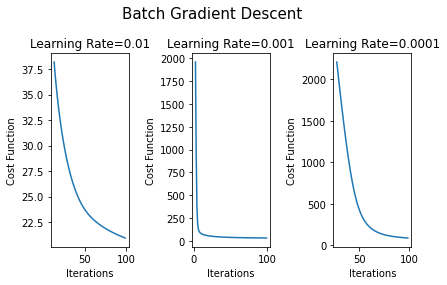

In [ ]:
fig = plt.figure()


fig.suptitle("Batch Gradient Descent", fontsize=15)
plt.subplot(1, 3, 1)
plt.plot(range(100),lossBatch_LR2_BG_L1)
plt.title('Learning Rate=0.01',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.subplot(1, 3, 2)
plt.title('Learning Rate=0.001',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.plot(range(100),lossBatch_LR2_BG_L2)
plt.subplot(1, 3, 3)
plt.title('Learning Rate=0.0001',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.plot(range(100),lossBatch_LR2_BG_L3)
plt.tight_layout()
plt.show()

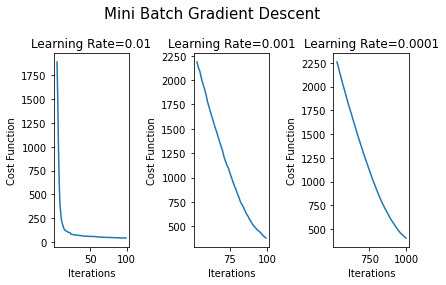

In [ ]:
fig = plt.figure()


fig.suptitle("Mini Batch Gradient Descent", fontsize=15)
plt.subplot(1, 3, 1)
plt.plot(range(100),lossBatch_LR2_MG_L1)
plt.title('Learning Rate=0.01',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.subplot(1, 3, 2)
plt.title('Learning Rate=0.001',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.plot(range(100),lossBatch_LR2_MG_L2)
plt.subplot(1, 3, 3)
plt.title('Learning Rate=0.0001',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.plot(range(1000),lossBatch_LR2_MG_L3)
plt.tight_layout()
plt.show()

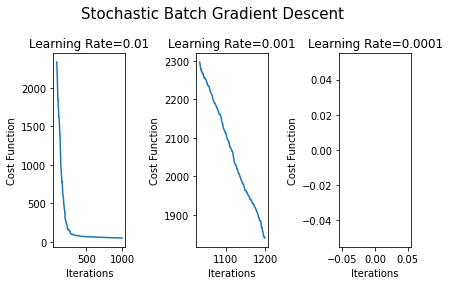

In [ ]:
fig = plt.figure()


fig.suptitle("Stochastic Batch Gradient Descent", fontsize=15)
plt.subplot(1, 3, 1)
plt.plot(range(1000),lossBatch_LR2_SG_L1)
plt.title('Learning Rate=0.01',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.subplot(1, 3, 2)
plt.title('Learning Rate=0.001',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.plot(range(1200),lossBatch_LR2_SG_L2)
plt.subplot(1, 3, 3)
plt.title('Learning Rate=0.0001',fontsize=12)
plt.ylabel('Cost Function')
plt.xlabel('Iterations')
plt.plot(range(5000),lossBatch_LR2_SG_L3)
plt.tight_layout()
plt.show()

# **Fischer's Linear Discriminant Analysis**

Transforming points to one dimension

In [ ]:
data_FLDA1=data_train.copy()
data_FLDA1.dropna(axis=0,inplace=True)
X_FLDA1=data_FLDA1.drop(["diagnosis","id"],axis=1)
y_FLDA1=data_FLDA1["diagnosis"]
y_FLDA1.replace('B',1,inplace=True)
y_FLDA1.replace('M',0,inplace=True)


In [ ]:
def classSplit(X,y):
  X1=np.zeros((np.count_nonzero(y),1))
  X2=np.zeros(((len(y)-np.count_nonzero(y)),1))
  c1=0
  c2=0
  for i in range(len(y)):
    if(y.iloc[i]==1):
      X1[c1]=X[i]
      c1+=1
    else:
      X2[c2]=X[i]
      c2+=1
  return X1,X2

In [ ]:
data_test_FLDA1=data_test.copy()
data_test_FLDA1.dropna(axis=0,inplace=True)
X_test_FM1=data_test_FLDA1.drop(["diagnosis","id"],axis=1)
y_test_FM1=data_test_FLDA1["diagnosis"]
y_test_FM1.replace('B',1,inplace=True)
y_test_FM1.replace('M',0,inplace=True)

In [ ]:
def FLDA1_Performance(data_train,data_test):
  data_FLDA1=data_train.copy()
  X_FLDA1=data_FLDA1.drop(["diagnosis","id"],axis=1)
  y_FLDA1=data_FLDA1["diagnosis"]
  y_FLDA1.replace('B',1,inplace=True)
  y_FLDA1.replace('M',0,inplace=True)

  data_test_FLDA1=data_test.copy()
  data_test_FLDA1.dropna(axis=0,inplace=True)
  X_test_FM1=data_test_FLDA1.drop(["diagnosis","id"],axis=1)
  y_test_FM1=data_test_FLDA1["diagnosis"]
  y_test_FM1.replace('B',1,inplace=True)
  y_test_FM1.replace('M',0,inplace=True)

  y_pred_FM1=FLDM(X_FLDA1,y_FLDA1,X_test_FM1)
  acc,pre,recall=testDataFLDA(y_test_FM1,y_pred_FM1)
  return acc,pre,recall



In [ ]:
def FLDA2_Performance(data_train,data_test):
  data_train_FLDA2=data_train.copy()
  data_test_FLDA2=data_test.copy()
  data=pd.concat([data_train_FLDA2,data_test_FLDA2])
  data=data.sample(frac=1,axis=1).reset_index(drop=True)
  x=int(0.67*len(data))
  data_train_FLDA2=data.iloc[:x,:]
  data_test_FLDA2=data.iloc[x:,:]
  data_FLDA2=data_train_FLDA2.copy()
  X_FLDA2=data_FLDA2.drop(["diagnosis","id"],axis=1)

  y_FLDA2=data_FLDA2["diagnosis"]
  y_FLDA2.replace('B',1,inplace=True)
  y_FLDA2.replace('M',0,inplace=True)

  X_test_FM2=data_test_FLDA2.drop(["diagnosis","id"],axis=1)
  replaceNull(X_test_FM2)
  y_test_FM2=data_test_FLDA2["diagnosis"]
  y_test_FM2.replace('B',1,inplace=True)
  y_test_FM2.replace('M',0,inplace=True)

  y_pred_FM2=FLDM(X_FLDA2,y_FLDA2,X_test_FM2)
  acc,pre,recall=testDataFLDA(y_test_FM2,y_pred_FM2)
  return acc,pre,recall

In [ ]:
df=data.copy()
data_train,data_test=splitData(df)
FLDA2_Performance(data_train,data_test)

In [ ]:
def normalProb(x,u,std):
  p=(1/(std*math.sqrt(2*math.pi)))*np.exp((-1/2)*math.pow(((x-u)/std),2))
  return p

In [ ]:
def FLDM(X_FLDA1,y_FLDA1,X_test):
  lda=LinearDiscriminantAnalysis(n_components=1)
  X_FLDA1=lda.fit(X_FLDA1,y_FLDA1).transform(X_FLDA1)
  X_F1B,X_F1M=classSplit(X_FLDA1,y_FLDA1)
  X_test=lda.transform(X_test)
  u1=np.mean(X_F1B)
  u2=np.mean(X_F1M)
  std1=np.std(X_F1B)
  std2=np.std(X_F1M)
  pc1=len(X_F1B)/len(y_FLDA1)
  pc2=len(X_F1M)/len(y_FLDA1)
  y_pred=np.zeros((len(X_test),1))
  for i in range(len(X_test)):
    p1=normalProb(X_test[i],u1,std1)*pc1
    p2=normalProb(X_test[i],u2,std2)*pc2
    if(p1>p2):
      y_pred[i]=1
    else:
      y_pred[i]=0
  return y_pred

In [ ]:
def testDataFLDA(y_test,y_pred):
  TN=0
  FP=0
  FN=0
  TP=0
  for i in range(len(y_test)):
    if(y_test.iloc[i]==1):
      if(y_pred[i]==1):
        TP+=1
      else:
        FN+=1
    else:
      if(y_pred[i]==1):
        FP+=1
      else:
        TN+=1
  accuracy=(TP+TN)/(TP+FP+TN+FN)
  precision=TP/(TP+FP)
  recall=TP/(TP+FN)
  print(TP,TN,FP,FN)
  print("Accuracy=",accuracy)
  print("Precision=",precision)
  print("Recall=",recall)
  return accuracy,precision,recall


In [ ]:
y_pred_FM1=FLDM(X_FLDA1,y_FLDA1,X_test_FM1)

In [ ]:
testDataFLDA(y_test_FM1,y_pred_FM1)

5 40 3 140
Accuracy= 0.2393617021276596
Precision= 0.625
Recall= 0.034482758620689655


(0.2393617021276596, 0.625, 0.034482758620689655)

Task 2

In [ ]:
data_FLDA2=data_train.copy()
X_FLDA2=data_FLDA2.drop(["diagnosis","id"],axis=1)
y_FLDA2=y_FLDA1.copy()
X_FLDA2=X_FLDA2.sample(frac=1,axis=1).reset_index(drop=True)

In [ ]:
#X_test_FM2=data_test.drop(["diagnosis","id"],axis=1)
#replaceNull(X_test_FM2)
#y_test_FM2=y_test_FM1.copy()
#X_test_FM2 = X_test_FM2.sample(frac=1,axis=1).reset_index(drop=True)

In [ ]:
y_pred_FM2=FLDM(X_FLDA1,y_FLDA1,X_test_FM1)

In [ ]:
testDataFLDA(y_test_FM1,y_pred_FM2)

5 40 3 140
Accuracy= 0.2393617021276596
Precision= 0.625
Recall= 0.034482758620689655


(0.2393617021276596, 0.625, 0.034482758620689655)

# Comparative Study

In [ ]:
def getPerformance(data):

  performanceMetrics=pd.DataFrame(np.zeros((7,3)),columns=["Accuracy","Precision","Recall"],index=["PM1","PM3","PM4","FLDM1","FLDM2","LR1","LR2"])

  for i in range(10):
    data_train,data_test=splitData(data)

    #PM1:
    a_PM1,p_PM1,r_PM1=PM1_Performance(data_train,data_test)
    performanceMetrics['Accuracy']['PM1']+=a_PM1
    performanceMetrics['Precision']['PM1']+=p_PM1
    performanceMetrics['Recall']['PM1']+=r_PM1

    #PM3:
    a_PM3,p_PM3,r_PM3=PM3_Performance(data_train,data_test)
    performanceMetrics['Accuracy']['PM3']+=a_PM3
    performanceMetrics['Precision']['PM3']+=p_PM3
    performanceMetrics['Recall']['PM3']+=r_PM3

    #PM4:
    a_PM4,p_PM4,r_PM4=PM4_Performance(data_train,data_test)
    performanceMetrics['Accuracy']['PM4']+=a_PM4
    performanceMetrics['Precision']['PM4']+=p_PM4
    performanceMetrics['Recall']['PM4']+=r_PM4

    #FLDM1:
    a_FLDM1,p_FLDM1,r_FLDM1=FLDA1_Performance(data_train,data_test)
    performanceMetrics['Accuracy']['FLDM1']+=a_FLDM1
    performanceMetrics['Precision']['FLDM1']+=p_FLDM1
    performanceMetrics['Recall']['FLDM1']+=r_FLDM1

    #FLDM2:
    a_FLDM2,p_FLDM2,r_FLDM2=FLDA2_Performance(data_train,data_test)
    performanceMetrics['Accuracy']['FLDM2']+=a_FLDM2
    performanceMetrics['Precision']['FLDM2']+=p_FLDM2
    performanceMetrics['Recall']['FLDM2']+=r_FLDM2

    #LR1:
    a_LR1,p_LR1,r_LR1=LR1_Performance(data_train,data_test)
    performanceMetrics['Accuracy']['LR1']+=a_LR1
    performanceMetrics['Precision']['LR1']+=p_LR1
    performanceMetrics['Recall']['LR1']+=r_LR1

    #LR2:
    a_LR2,p_LR2,r_LR2=LR2_Performance(data_train,data_test)
    performanceMetrics['Accuracy']['LR2']+=a_LR2
    performanceMetrics['Precision']['LR2']+=p_LR2
    performanceMetrics['Recall']['LR2']+=r_LR2



  return performanceMetrics



In [ ]:
datafinal=getPerformance(data)

Streaming output truncated to the last 5000 lines.
  -8.318600e+00 -1.091229e+00  7.720200e-01  1.266080e+01  2.457360e+03
   9.842000e+02  5.384090e+01  2.372190e+03  7.322400e+02 -1.148000e-01
   1.531390e-01 -1.665226e+00 -2.829000e+03  3.434650e+00  3.374590e-01
  -4.601294e+00  4.055180e+02  2.764600e+03  3.999680e+02  8.281700e+00
   1.992400e-01  1.375133e-01  5.569570e+00  3.118440e+00  1.019465e+00
   2.989700e-01]]
[[ 5.100000e+01  1.892840e-01  4.254510e+00 -3.422534e+00 -1.055200e+03
  -8.318600e+00 -1.091229e+00  7.720200e-01  1.266080e+01  2.457360e+03
   9.842000e+02  5.384090e+01  2.372190e+03  7.322400e+02 -1.148000e-01
   1.531390e-01 -1.665226e+00 -2.829000e+03  3.434650e+00  3.374590e-01
  -4.601294e+00  4.055180e+02  2.764600e+03  3.999680e+02  8.281700e+00
   1.992400e-01  1.375133e-01  5.569570e+00  3.118440e+00  1.019465e+00
   2.989700e-01]]
[[ 5.100000e+01  1.892840e-01  4.254510e+00 -3.422534e+00 -1.055200e+03
  -8.318600e+00 -1.091229e+00  7.720200e-01  1.26

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   4.55161265 -0.16318805  1.44679384 -1.84180332  1.6007007   0.75605187
   2.28162554]]
[[-5.         -1.13242874 -1.53868695 -2.79054025 -4.65493434 -4.65800147
  -3.37514277 -1.06936652 -1.54095394 -4.39425504 -6.28138069  1.65021906
  -4.80594114 -6.36686386 -4.58977242 -2.58362958 -2.57967412 -3.94379017
   1.16442294 -2.66332455 -2.77804358 -4.39947746 -3.73642008 -4.37998948
   4.55161265 -0.16318805  1.44679384 -1.84180332  1.6007007   0.75605187
   2.28162554]]
[[-5.         -1.13242874 -1.53868695 -2.79054025 -4.65493434 -4.65800147
  -3.37514277 -1.06936652 -1.54095394 -4.39425504 -6.28138069  1.65021906
  -4.80594114 -6.36686386 -4.58977242 -2.58362958 -2.57967412 -3.94379017
   1.16442294 -2.66332455 -2.77804358 -4.39947746 -3.73642008 -4.37998948
   4.55161265 -0.16318805  1.44679384 -1.84180332  1.6007007   0.75605187
   2.28162554]]
[[-5.         -1.13242874 -1.53868695 -2.79054025 -4.65493434 -4.65800147
  -3.37514277

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   8.281700e+00  7.322400e+02 -8.318600e+00 -4.601294e+00  3.434650e+00
   7.720200e-01  3.374590e-01  2.989700e-01  2.372190e+03  5.569570e+00
   1.992400e-01]]
[[ 5.100000e+01 -1.091229e+00  2.764600e+03  4.254510e+00  2.457360e+03
   1.531390e-01 -1.665226e+00 -3.422534e+00  1.375133e-01 -2.829000e+03
   1.892840e-01  5.384090e+01  3.999680e+02  9.842000e+02  3.118440e+00
   4.055180e+02 -1.148000e-01  1.266080e+01  1.019465e+00 -1.055200e+03
   8.281700e+00  7.322400e+02 -8.318600e+00 -4.601294e+00  3.434650e+00
   7.720200e-01  3.374590e-01  2.989700e-01  2.372190e+03  5.569570e+00
   1.992400e-01]]
[[ 5.100000e+01 -1.091229e+00  2.764600e+03  4.254510e+00  2.457360e+03
   1.531390e-01 -1.665226e+00 -3.422534e+00  1.375133e-01 -2.829000e+03
   1.892840e-01  5.384090e+01  3.999680e+02  9.842000e+02  3.118440e+00
   4.055180e+02 -1.148000e-01  1.266080e+01  1.019465e+00 -1.055200e+03
   8.281700e+00  7.322400e+02 -8.318600e+00 -4.60

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


 M
[312259.12549991]
B B
[511888.40567551]
B B
[-130142.25001808]
M M
[444798.44851782]
B B
[-654999.11629995]
M M
[267693.88277185]
B B
[212821.38001638]
B B
[-1261301.87498045]
M M
[418653.75977949]
B B
[216998.87644142]
M B
[433747.78944411]
B B
[417681.47604099]
B B
[207132.11198491]
B B
[246445.00852383]
B B
[295846.34953887]
B B
[421990.74982658]
B B
[353697.98538972]
B B
[388652.55864738]
B B
[-1786690.3014069]
M M
[-5731703.79917322]
M M
[513701.93527629]
B B
[374696.20478268]
B B
[197939.84407894]
B B
[126795.72743177]
B B
[211592.87801468]
B B
[216870.33181118]
B B
[-766570.26680344]
M M
[243808.70396829]
B B
[208641.24063892]
B B
[249002.36102489]
B B
[25045.84186817]
B B
[361089.45356839]
B B
[377905.95848516]
B B
[382717.0885877]
B B
[55679.82922475]
B B
[362179.02928372]
B B
[439647.98888612]
B B
[496810.52581199]
M B
[381417.74204173]
B B
[-58775.14422099]
B M
[344708.87799812]
B B
[345715.42803758]
B B
[497788.3899791]
B B
[358545.74582903]
B B
[223727.1557703]
B B
[-10

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


140 6 37 5
Accuracy= 0.776595744680851
Precision= 0.7909604519774012
Recall= 0.9655172413793104
[-33.84642881]
[-37.67413751]
[-56.81154666]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf

<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-29.70174406]
[-29.70190821]
[-29.70337794]
[-29.703378]
[-30.04405437]
[-30.04529695]
[-30.04759614]
[-30.04767686]
[-30.05124214]
[-30.05125768]
[-30.05408581]
[-30.11895121]
[-30.11999067]
[-30.12109042]
[-30.12152618]
[-30.13242674]
[-30.13242675]
[-30.14235022]
[-30.14243356]
[-30.15478033]
[-30.2524951]
[-30.2575757]
[-30.25765263]
[-30.25897449]
[-30.25960068]
[-30.2872062]
[-30.30099682]
[-30.78900562]
[-30.79478757]
[-30.7954444]
[-30.79545522]
[-30.82539714]
[-30.82540126]
[-30.82540167]
[-30.82596742]
[-30.8315768]
[-30.83635938]
[-30.83653928]
[-30.84280166]
[-30.97973795]
[-30.98668721]
[-31.11168645]
[-31.12102268]
[-31.12794023]
[-31.14846347]
[-1.41888658e-05]
[-0.00543316]
[-0.00545543]
[-0.02393505]
[-0.02970344]
[-0.27703315]
[-0.27860612]
[-0.40102599]
[-0.40711794]
[-0.40776139]
[-0.66853386]
[-0.68214256]
[-0.68308998]
[-1.02656794]
[-1.03547861]
[-1.03609068]
[-1.08885185]
[-1.08925238]
[-1.08925537]
[-1.1531468

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
[[ 5.200000e+01 -8.204600e+00 -2.830500e+03  1.926640e-01  2.416370e+03
   4.329720e+00 -8.880000e-02 -1.708146e+00  1.396913e-01  8.401500e+00
   7.479200e+02  2.301400e-01  5.427540e+01  7.524600e-01  1.284770e+01
   4.139880e+02 -4.711194e+00  2.924000e+03  3.173830e+00  1.546000e-01
   3.498790e+00  4.076480e+02 -1.131879e+00  3.443170e-01  9.989500e+02
   5.686570e+00 -3.523134e+00  1.029665e+00  3.137000e-01  2.508590e+03
  -1.061090e+03]]
[[ 5.200000e+01 -8.204600e+00 -2.830500e+03  1.926640e-01  2.416370e+03
   4.329720e+00 -8.880000e-02 -1.708146e+00  1.396913e-01  8.401500e+00
   7.479200e+02  2.301400e-01  5.427540e+01  7.524600e-01  1.284770e+01
   4.139880e+02 -4.711194e+00  2.924000e+03  3.173830e+00  1.546000e-01
   3.498790e+00  4.076480e+02 -1.131879e+00  3.443170e-01  9.989500e+02
   5.686570e+00 -3.523134e+00  1.029665e+00  3.137000e-01  2.508590e+03
  -1.061090e+03]]
[[ 5.200000e+01 -8.204600e+00 -2.830500e+03  1.92

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   1.6007007  -2.58362958  1.16442294 -4.37998948 -3.37514277 -2.66332455
  -6.28138069 -1.84180332 -2.79054025  0.75605187  2.28162554 -4.39425504
  -4.65493434]]
[[-5.         -4.65800147 -3.94379017 -1.13242874 -4.80594114 -1.53868695
  -4.58977242 -2.57967412  1.44679384  4.55161265 -6.36686386 -0.16318805
   1.65021906 -1.06936652 -1.54095394 -4.39947746 -2.77804358 -3.73642008
   1.6007007  -2.58362958  1.16442294 -4.37998948 -3.37514277 -2.66332455
  -6.28138069 -1.84180332 -2.79054025  0.75605187  2.28162554 -4.39425504
  -4.65493434]]
[[-5.         -4.65800147 -3.94379017 -1.13242874 -4.80594114 -1.53868695
  -4.58977242 -2.57967412  1.44679384  4.55161265 -6.36686386 -0.16318805
   1.65021906 -1.06936652 -1.54095394 -4.39947746 -2.77804358 -3.73642008
   1.6007007  -2.58362958  1.16442294 -4.37998948 -3.37514277 -2.66332455
  -6.28138069 -1.84180332 -2.79054025  0.75605187  2.28162554 -4.39425504
  -4.65493434]]
[[-5.        

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   1.019465e+00  5.384090e+01  2.372190e+03  1.531390e-01  1.892840e-01
   3.374590e-01 -4.601294e+00  9.842000e+02 -1.665226e+00  4.055180e+02
  -8.318600e+00  3.118440e+00  1.992400e-01 -2.829000e+03 -3.422534e+00
   3.999680e+02 -1.091229e+00  7.322400e+02 -1.148000e-01  1.266080e+01
   4.254510e+00  2.457360e+03  8.281700e+00  2.764600e+03  1.375133e-01
   2.989700e-01]]
[[ 5.100000e+01  5.569570e+00 -1.055200e+03  3.434650e+00  7.720200e-01
   1.019465e+00  5.384090e+01  2.372190e+03  1.531390e-01  1.892840e-01
   3.374590e-01 -4.601294e+00  9.842000e+02 -1.665226e+00  4.055180e+02
  -8.318600e+00  3.118440e+00  1.992400e-01 -2.829000e+03 -3.422534e+00
   3.999680e+02 -1.091229e+00  7.322400e+02 -1.148000e-01  1.266080e+01
   4.254510e+00  2.457360e+03  8.281700e+00  2.764600e+03  1.375133e-01
   2.989700e-01]]
[[ 5.100000e+01  5.569570e+00 -1.055200e+03  3.434650e+00  7.720200e-01
   1.019465e+00  5.384090e+01  2.372190e+03  1.53

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


 B
[-130142.25001808]
M M
[444798.44851782]
B B
[-654999.11629994]
M M
[267693.88277185]
B B
[212821.38001638]
B B
[-1261301.87498045]
M M
[418653.75977948]
B B
[216998.87644142]
M B
[433747.78944411]
B B
[417681.476041]
B B
[207132.11198491]
B B
[246445.00852383]
B B
[295846.34953887]
B B
[421990.74982658]
B B
[353697.98538972]
B B
[388652.55864738]
B B
[-1786690.3014069]
M M
[-5731703.79917322]
M M
[513701.93527629]
B B
[374696.20478268]
B B
[197939.84407894]
B B
[126795.72743177]
B B
[211592.87801468]
B B
[216870.33181118]
B B
[-766570.26680344]
M M
[243808.70396829]
B B
[208641.24063892]
B B
[249002.36102489]
B B
[25045.84186817]
B B
[361089.4535684]
B B
[377905.95848516]
B B
[382717.0885877]
B B
[55679.82922475]
B B
[362179.02928372]
B B
[439647.98888612]
B B
[496810.52581199]
M B
[381417.74204173]
B B
[-58775.14422099]
B M
[344708.87799812]
B B
[345715.42803758]
B B
[497788.3899791]
B B
[358545.74582903]
B B
[223727.1557703]
B B
[-1092146.16582828]
M M
[186481.73719011]
B B
[1268

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))



[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[n

<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-22.22460733]
[-22.22460999]
[-22.22925621]
[-22.2292623]
[-22.2292724]
[-22.22929152]
[-22.44646382]
[-22.45630681]
[-23.47696266]
[-23.47848699]
[-23.47848701]
[-23.4834207]
[-23.51148292]
[-23.51728674]
[-23.52172961]
[-23.52237256]
[-23.52313441]
[-23.52313607]
[-23.52327804]
[-23.5467174]
[-23.56530915]
[-23.56539739]
[-23.6714066]
[-23.68034821]
[-23.711565]
[-23.71157233]
[-23.71285899]
[-23.71303546]
[-23.73325715]
[-23.7400197]
[-23.74033115]
[-23.75574049]
[-23.75593253]
[-23.76022251]
[-23.7613951]
[-23.76574535]
[-24.47065341]
[-24.47838408]
[-24.48770092]
[-24.48893969]
[-24.48999831]
[-24.49001066]
[-29.10352621]
[-29.12443994]
[-29.12505856]
[-29.12507012]
[-29.13229898]
[-29.13233618]
[-29.1330151]
[-29.13419188]
[-29.138241]
[-29.13898756]
[-29.13899105]
[-29.139221]
[-29.13987388]
[-29.14215261]
[-29.15029925]
[-29.15209639]
[-29.15216383]
[-29.15216443]
[-29.15254072]
[-29.15263459]
[-29.15768458]
[-29.16103919]
[-2

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -1.665226e+00  5.569570e+00  3.434650e+00  1.266080e+01  1.019465e+00
   2.372190e+03  4.055180e+02  3.118440e+00  9.842000e+02  3.374590e-01
  -3.422534e+00]]
[[ 5.100000e+01 -8.318600e+00  8.281700e+00  1.892840e-01  1.375133e-01
  -4.601294e+00  2.457360e+03  1.531390e-01  2.989700e-01 -1.055200e+03
   2.764600e+03  1.992400e-01  7.322400e+02 -1.091229e+00  7.720200e-01
   3.999680e+02 -2.829000e+03 -1.148000e-01  5.384090e+01  4.254510e+00
  -1.665226e+00  5.569570e+00  3.434650e+00  1.266080e+01  1.019465e+00
   2.372190e+03  4.055180e+02  3.118440e+00  9.842000e+02  3.374590e-01
  -3.422534e+00]]
[[ 5.100000e+01 -8.318600e+00  8.281700e+00  1.892840e-01  1.375133e-01
  -4.601294e+00  2.457360e+03  1.531390e-01  2.989700e-01 -1.055200e+03
   2.764600e+03  1.992400e-01  7.322400e+02 -1.091229e+00  7.720200e-01
   3.999680e+02 -2.829000e+03 -1.148000e-01  5.384090e+01  4.254510e+00
  -1.665226e+00  5.569570e+00  3.434650e+00  1.26

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   1.65021906 -1.53868695 -2.57967412 -1.84180332  1.16442294 -1.54095394
   0.75605187 -4.80594114 -4.39947746  1.6007007  -6.28138069 -2.66332455
  -2.79054025]]
[[-5.         -4.65800147  4.55161265 -1.13242874  1.44679384 -2.77804358
  -4.39425504 -2.58362958  2.28162554 -4.65493434 -3.73642008 -0.16318805
  -6.36686386 -3.37514277 -1.06936652 -4.37998948 -3.94379017 -4.58977242
   1.65021906 -1.53868695 -2.57967412 -1.84180332  1.16442294 -1.54095394
   0.75605187 -4.80594114 -4.39947746  1.6007007  -6.28138069 -2.66332455
  -2.79054025]]
[[-5.         -4.65800147  4.55161265 -1.13242874  1.44679384 -2.77804358
  -4.39425504 -2.58362958  2.28162554 -4.65493434 -3.73642008 -0.16318805
  -6.36686386 -3.37514277 -1.06936652 -4.37998948 -3.94379017 -4.58977242
   1.65021906 -1.53868695 -2.57967412 -1.84180332  1.16442294 -1.54095394
   0.75605187 -4.80594114 -4.39947746  1.6007007  -6.28138069 -2.66332455
  -2.79054025]]
[[-5.        

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   1.375133e-01 -8.318600e+00  3.999680e+02  1.892840e-01  2.989700e-01
   1.266080e+01]]
[[ 5.100000e+01  1.531390e-01  4.055180e+02  3.374590e-01  1.992400e-01
   5.569570e+00  4.254510e+00  3.118440e+00 -1.055200e+03  9.842000e+02
   2.764600e+03  7.720200e-01 -1.091229e+00  7.322400e+02 -1.148000e-01
  -1.665226e+00  2.372190e+03 -3.422534e+00  5.384090e+01  8.281700e+00
   3.434650e+00  1.019465e+00 -2.829000e+03 -4.601294e+00  2.457360e+03
   1.375133e-01 -8.318600e+00  3.999680e+02  1.892840e-01  2.989700e-01
   1.266080e+01]]
[[ 5.100000e+01  1.531390e-01  4.055180e+02  3.374590e-01  1.992400e-01
   5.569570e+00  4.254510e+00  3.118440e+00 -1.055200e+03  9.842000e+02
   2.764600e+03  7.720200e-01 -1.091229e+00  7.322400e+02 -1.148000e-01
  -1.665226e+00  2.372190e+03 -3.422534e+00  5.384090e+01  8.281700e+00
   3.434650e+00  1.019465e+00 -2.829000e+03 -4.601294e+00  2.457360e+03
   1.375133e-01 -8.318600e+00  3.999680e+02  1.89

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


M M
[267693.88277185]
B B
[212821.38001638]
B B
[-1261301.87498044]
M M
[418653.75977948]
B B
[216998.87644142]
M B
[433747.78944411]
B B
[417681.476041]
B B
[207132.11198491]
B B
[246445.00852383]
B B
[295846.34953887]
B B
[421990.74982658]
B B
[353697.98538972]
B B
[388652.55864738]
B B
[-1786690.3014069]
M M
[-5731703.79917322]
M M
[513701.93527629]
B B
[374696.20478268]
B B
[197939.84407894]
B B
[126795.72743177]
B B
[211592.87801468]
B B
[216870.33181118]
B B
[-766570.26680344]
M M
[243808.70396829]
B B
[208641.24063892]
B B
[249002.36102489]
B B
[25045.84186817]
B B
[361089.4535684]
B B
[377905.95848517]
B B
[382717.0885877]
B B
[55679.82922475]
B B
[362179.02928372]
B B
[439647.98888612]
B B
[496810.52581199]
M B
[381417.74204173]
B B
[-58775.14422099]
B M
[344708.87799812]
B B
[345715.42803758]
B B
[497788.3899791]
B B
[358545.74582903]
B B
[223727.1557703]
B B
[-1092146.16582828]
M M
[186481.73719011]
B B
[126899.63674373]
M B
[154504.50906626]
B B
[130628.14987307]
B B
[-6089

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-4.90790593]
[-4.90869961]
[-4.91124413]
[-4.9112592]
[-4.92216632]
[-4.931773]
[-4.93371999]
[-4.93670906]
[-4.98662855]
[-4.98927396]
[-4.98967221]
[-4.98967302]
[-4.98973747]
[-6.57509367]
[-6.58383956]
[-6.59964978]
[-6.60086963]
[-6.60150584]
[-6.60150676]
[-6.6252266]
[-6.64206179]
[-7.21843661]
[-7.21843661]
[-7.22017259]
[-7.22958286]
[-7.23200053]
[-7.62887602]
[-7.62900734]
[-7.74476019]
[-8.14478241]
[-8.31505391]
[-8.67827636]
[-8.7000618]
[-8.76177916]
[-8.76866609]
[-8.76894536]
[-8.77053365]
[-8.77065263]
[-8.77192873]
[-9.16623698]
[-9.27014787]
[-9.27015026]
[-9.28647813]
[-9.29948444]
[-9.30008168]
[-9.37306429]
[-9.53425379]
[-9.54812349]
[-9.54812349]
[-9.58872248]
[-9.58892674]
[-9.62158681]
[-9.8289339]
[-9.8294436]
[-9.83015028]
[-9.86059372]
[-9.86062582]
[-9.86565575]
[-9.86605529]
[-9.99118087]
[-9.99265783]
[-9.99817384]
[-9.9981742]
[-10.03174235]
[-10.03754837]
[-10.04384548]
[-10.14250671]
[-10.15861382]


<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   2.457360e+03]]
[[ 5.100000e+01 -1.091229e+00  1.892840e-01  4.055180e+02  7.720200e-01
   3.118440e+00  1.266080e+01  8.281700e+00  2.372190e+03 -2.829000e+03
   5.384090e+01 -4.601294e+00  1.531390e-01  1.992400e-01 -3.422534e+00
   3.374590e-01  4.254510e+00  3.999680e+02 -1.055200e+03  2.764600e+03
  -1.665226e+00 -8.318600e+00  3.434650e+00  5.569570e+00  1.375133e-01
   1.019465e+00 -1.148000e-01  2.989700e-01  9.842000e+02  7.322400e+02
   2.457360e+03]]
[[ 5.100000e+01 -1.091229e+00  1.892840e-01  4.055180e+02  7.720200e-01
   3.118440e+00  1.266080e+01  8.281700e+00  2.372190e+03 -2.829000e+03
   5.384090e+01 -4.601294e+00  1.531390e-01  1.992400e-01 -3.422534e+00
   3.374590e-01  4.254510e+00  3.999680e+02 -1.055200e+03  2.764600e+03
  -1.665226e+00 -8.318600e+00  3.434650e+00  5.569570e+00  1.375133e-01
   1.019465e+00 -1.148000e-01  2.989700e-01  9.842000e+02  7.322400e+02
   2.457360e+03]]
[[ 5.100000e+01 -1.091229e+00  

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
[[-5.         -3.37514277 -1.13242874 -4.39947746 -1.06936652  1.6007007
  -1.54095394  4.55161265 -4.80594114 -3.94379017  1.65021906 -2.77804358
  -2.58362958 -0.16318805 -2.79054025 -2.66332455 -1.53868695 -4.37998948
  -4.65493434 -3.73642008 -2.57967412 -4.65800147  1.16442294 -1.84180332
   1.44679384  0.75605187 -4.58977242  2.28162554 -6.28138069 -6.36686386
  -4.39425504]]
[[-5.         -3.37514277 -1.13242874 -4.39947746 -1.06936652  1.6007007
  -1.54095394  4.55161265 -4.80594114 -3.94379017  1.65021906 -2.77804358
  -2.58362958 -0.16318805 -2.79054025 -2.66332455 -1.53868695 -4.37998948
  -4.65493434 -3.73642008 -2.57967412 -4.65800147  1.16442294 -1.84180332
   1.44679384  0.75605187 -4.58977242  2.28162554 -6.28138069 -6.36686386
  -4.39425504]]
[[-5.         -3.37514277 -1.13242874 -4.39947746 -1.06936652  1.6007007
  -1.54095394  4.55161265 -4.80594114 -3.94379017  1.65021906 -2.77804358
  -2.58362958 -0.16318805 -2.790

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   5.457270e+00  8.107800e+00  3.323790e-01  7.316400e-01  1.463420e-01
  -3.446364e+00  2.928720e-01  1.239140e+01 -9.501600e+00  3.933380e+02
   2.287610e+03  2.305900e+03 -3.072000e-01 -1.069880e+03  1.106200e-01
   3.365870e+00  3.061670e+00  7.117200e+02  2.380140e+03  1.004995e+00
   1.359813e-01 -3.376800e+03 -4.715794e+00  1.785940e-01  4.174380e+00
   3.866280e+02]]
add 102
[[ 5.100000e+01 -1.665226e+00  9.842000e+02  5.384090e+01 -1.091229e+00
   5.569570e+00  8.281700e+00  3.374590e-01  7.720200e-01  1.531390e-01
  -3.422534e+00  2.989700e-01  1.266080e+01 -8.318600e+00  4.055180e+02
   2.372190e+03  2.764600e+03 -1.148000e-01 -1.055200e+03  1.992400e-01
   3.434650e+00  3.118440e+00  7.322400e+02  2.457360e+03  1.019465e+00
   1.375133e-01 -2.829000e+03 -4.601294e+00  1.892840e-01  4.254510e+00
   3.999680e+02]]
[[ 5.100000e+01 -1.665226e+00  9.842000e+02  5.384090e+01 -1.091229e+00
   5.569570e+00  8.281700e+00  3.374590e-

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


B B
[359919.97272064]
B B
[225421.76501969]
B B
[-335763.32811749]
M M
[167301.28036999]
B B
[242754.21895714]
B B
[289941.99845831]
B B
[463796.306269]
B B
[225783.36352544]
B B
[65208.16587038]
M B
[367936.08002327]
B B
[232126.11217478]
B B
[-2799220.46159482]
M M
[443093.37848053]
B B
[369471.92572527]
B B
[275115.32988946]
B B
[263707.55051647]
B B
[422662.43600001]
B B
[311322.84840437]
B B
[201039.36427464]
B B
[342490.51680539]
B B
[227484.34129667]
B B
[178949.6878897]
B B
[488679.60905732]
B B
[397985.56500869]
B B
[407093.5028424]
M B
[563456.88943104]
B B
[261316.02592044]
M B
[-879091.28181431]
M M
[438358.5661362]
B B
[-154509.2750033]
M M
[307643.58174819]
B B
[262761.18755526]
B B
[206373.19953789]
B B
[478756.86870903]
B B
[302964.27527819]
B B
[-362695.31399312]
M M
[312259.12549991]
B B
[511888.40567551]
B B
[-130142.25001808]
M M
[444798.44851782]
B B
[-654999.11629995]
M M
[267693.88277185]
B B
[212821.38001638]
B B
[-1261301.87498044]
M M
[418653.75977948]
B B
[21

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-29.78865437]
[-29.78921657]
[-29.78944216]
[-29.78961089]
[-29.79108393]
[-29.79108399]
[-30.13225168]
[-30.13351128]
[-30.13582426]
[-30.13590722]
[-30.13947781]
[-30.13949348]
[-30.14232709]
[-30.20735938]
[-30.20840311]
[-30.20951243]
[-30.20995227]
[-30.22098834]
[-30.22098834]
[-30.23116066]
[-30.23124561]
[-30.24367463]
[-30.34136744]
[-30.34647391]
[-30.34655184]
[-30.34787686]
[-30.34850915]
[-30.3761512]
[-30.38997481]
[-30.87609026]
[-30.8819213]
[-30.88259119]
[-30.88260238]
[-30.91255157]
[-30.91255585]
[-30.91255627]
[-30.91313456]
[-30.91881413]
[-30.92362111]
[-30.92380475]
[-30.93011836]
[-31.06771577]
[-31.07479128]
[-31.19919021]
[-31.2086091]
[-31.21561887]
[-31.23617253]
[-1.44991218e-05]
[-0.00551559]
[-0.00553841]
[-0.02439833]
[-0.03024477]
[-0.27927836]
[-0.28087906]
[-0.40488258]
[-0.41106589]
[-0.41171994]
[-0.67511097]
[-0.68888236]
[-0.68984334]
[-1.03594076]
[-1.04490964]
[-1.04553549]
[-1.09913743]
[-1.0

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   4.254510e+00  1.375133e-01 -8.318600e+00  7.322400e+02 -1.091229e+00
   1.019465e+00  3.999680e+02  3.118440e+00  5.569570e+00  3.434650e+00
   4.055180e+02  2.764600e+03 -1.055200e+03  2.989700e-01  2.372190e+03
   7.720200e-01 -1.148000e-01 -1.665226e+00  1.892840e-01  1.992400e-01
   9.842000e+02]]
[[ 5.100000e+01 -2.829000e+03  5.384090e+01  8.281700e+00  2.457360e+03
   1.266080e+01 -3.422534e+00  1.531390e-01 -4.601294e+00  3.374590e-01
   4.254510e+00  1.375133e-01 -8.318600e+00  7.322400e+02 -1.091229e+00
   1.019465e+00  3.999680e+02  3.118440e+00  5.569570e+00  3.434650e+00
   4.055180e+02  2.764600e+03 -1.055200e+03  2.989700e-01  2.372190e+03
   7.720200e-01 -1.148000e-01 -1.665226e+00  1.892840e-01  1.992400e-01
   9.842000e+02]]
[[ 5.100000e+01 -2.829000e+03  5.384090e+01  8.281700e+00  2.457360e+03
   1.266080e+01 -3.422534e+00  1.531390e-01 -4.601294e+00  3.374590e-01
   4.254510e+00  1.375133e-01 -8.318600e+00  7.32

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -4.65800147 -6.36686386 -3.37514277  0.75605187 -4.37998948  1.6007007
  -1.84180332  1.16442294 -4.39947746 -3.73642008 -4.65493434  2.28162554
  -4.80594114 -1.06936652 -4.58977242 -2.57967412 -1.13242874 -0.16318805
  -6.28138069]]
[[-5.         -3.94379017  1.65021906  4.55161265 -4.39425504 -1.54095394
  -2.79054025 -2.58362958 -2.77804358 -2.66332455 -1.53868695  1.44679384
  -4.65800147 -6.36686386 -3.37514277  0.75605187 -4.37998948  1.6007007
  -1.84180332  1.16442294 -4.39947746 -3.73642008 -4.65493434  2.28162554
  -4.80594114 -1.06936652 -4.58977242 -2.57967412 -1.13242874 -0.16318805
  -6.28138069]]
[[-5.         -3.94379017  1.65021906  4.55161265 -4.39425504 -1.54095394
  -2.79054025 -2.58362958 -2.77804358 -2.66332455 -1.53868695  1.44679384
  -4.65800147 -6.36686386 -3.37514277  0.75605187 -4.37998948  1.6007007
  -1.84180332  1.16442294 -4.39947746 -3.73642008 -4.65493434  2.28162554
  -4.80594114 -1.06936652 -4.589

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   1.605820e-01  9.626800e+02  8.102700e+00  9.930250e-01 -4.396394e+00
  -1.624536e+00 -3.352484e+00  1.363333e-01  7.700600e-01 -1.052863e+03
   2.118040e-01  7.180600e+02  3.047390e+00 -8.678600e+00  4.154900e+00
   3.109820e-01  2.804900e+03  3.950280e+02 -1.009039e+00  1.237000e+01
   3.301940e-01]]
[[ 5.000000e+01 -2.418000e-01  5.261290e+01  3.365580e+00  4.007770e+02
   2.346700e+03 -2.735600e+03  2.930200e-01  5.441970e+00  2.430830e+03
   1.605820e-01  9.626800e+02  8.102700e+00  9.930250e-01 -4.396394e+00
  -1.624536e+00 -3.352484e+00  1.363333e-01  7.700600e-01 -1.052863e+03
   2.118040e-01  7.180600e+02  3.047390e+00 -8.678600e+00  4.154900e+00
   3.109820e-01  2.804900e+03  3.950280e+02 -1.009039e+00  1.237000e+01
   3.301940e-01]]
[[ 5.000000e+01 -2.418000e-01  5.261290e+01  3.365580e+00  4.007770e+02
   2.346700e+03 -2.735600e+03  2.930200e-01  5.441970e+00  2.430830e+03
   1.605820e-01  9.626800e+02  8.102700e+00  9.93

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


B B
[430043.72004973]
B B
[564852.93797751]
M B
[319316.81785715]
B B
[191487.89098685]
B B
[-1410598.37431774]
M M
[-1362278.73209972]
M M
[283477.03209552]
B B
[527135.55940752]
B B
[355737.72134631]
B B
[414583.76970031]
B B
[200253.26787096]
B B
[189628.29675319]
B B
[-60750.36542778]
M M
[128920.3613565]
B B
[408579.50777289]
B B
[476628.92928022]
B B
[431791.22294717]
B B
[266195.71423135]
B B
[359919.97272064]
B B
[225421.76501969]
B B
[-335763.32811749]
M M
[167301.28036999]
B B
[242754.21895714]
B B
[289941.99845831]
B B
[463796.306269]
B B
[225783.36352544]
B B
[65208.16587038]
M B
[367936.08002327]
B B
[232126.11217478]
B B
[-2799220.46159482]
M M
[443093.37848053]
B B
[369471.92572527]
B B
[275115.32988946]
B B
[263707.55051647]
B B
[422662.43600001]
B B
[311322.84840438]
B B
[201039.36427464]
B B
[342490.51680539]
B B
[227484.34129667]
B B
[178949.6878897]
B B
[488679.60905732]
B B
[397985.56500869]
B B
[407093.5028424]
M B
[563456.88943104]
B B
[261316.02592044]
M B
[-879

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


[-33.84642881]
[-37.67413751]
[-56.81154666]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-i

<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-23.56530915]
[-23.56539739]
[-23.6714066]
[-23.68034821]
[-23.711565]
[-23.71157233]
[-23.71285899]
[-23.71303546]
[-23.73325715]
[-23.7400197]
[-23.74033115]
[-23.75574049]
[-23.75593253]
[-23.76022251]
[-23.7613951]
[-23.76574535]
[-24.47065341]
[-24.47838408]
[-24.48770092]
[-24.48893969]
[-24.48999831]
[-24.49001066]
[-29.10352621]
[-29.12443994]
[-29.12505856]
[-29.12507012]
[-29.13229898]
[-29.13233618]
[-29.1330151]
[-29.13419188]
[-29.138241]
[-29.13898756]
[-29.13899105]
[-29.139221]
[-29.13987388]
[-29.14215261]
[-29.15029925]
[-29.15209639]
[-29.15216383]
[-29.15216443]
[-29.15254072]
[-29.15263459]
[-29.15768458]
[-29.16103919]
[-29.16114493]
[-29.16171331]
[-29.16866151]
[-29.18346014]
[-29.18346117]
[-29.18580368]
[-29.19039872]
[-29.19245255]
[-29.19277978]
[-29.1973983]
[-29.60360956]
[-29.65668186]
[-29.69867373]
[-29.69920479]
[-29.69938435]
[-29.70097485]
[-29.70152258]
[-29.70174406]
[-29.70190821]
[-29.70337794]


<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   7.479200e+02 -4.711194e+00  5.686570e+00  2.508590e+03  4.076480e+02
   4.329720e+00  2.416370e+03  1.926640e-01 -1.708146e+00  2.924000e+03
  -1.061090e+03  1.396913e-01  7.524600e-01  1.029665e+00 -8.880000e-02
   3.173830e+00  1.546000e-01  3.498790e+00  2.301400e-01  3.137000e-01
   1.284770e+01 -3.523134e+00  9.989500e+02  3.443170e-01 -1.131879e+00
  -8.204600e+00]]
[[ 5.200000e+01  8.401500e+00 -2.830500e+03  4.139880e+02  5.427540e+01
   7.479200e+02 -4.711194e+00  5.686570e+00  2.508590e+03  4.076480e+02
   4.329720e+00  2.416370e+03  1.926640e-01 -1.708146e+00  2.924000e+03
  -1.061090e+03  1.396913e-01  7.524600e-01  1.029665e+00 -8.880000e-02
   3.173830e+00  1.546000e-01  3.498790e+00  2.301400e-01  3.137000e-01
   1.284770e+01 -3.523134e+00  9.989500e+02  3.443170e-01 -1.131879e+00
  -8.204600e+00]]
[[ 5.200000e+01  8.401500e+00 -2.830500e+03  4.139880e+02  5.427540e+01
   7.479200e+02 -4.711194e+00  5.686570e+00  2.50

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   0.75605187 -4.58977242  1.6007007  -2.58362958  1.16442294 -0.16318805
   2.28162554 -1.54095394 -2.79054025 -6.28138069 -2.66332455 -3.37514277
  -4.65800147]]
[[-5.          4.55161265 -3.94379017 -4.39947746  1.65021906 -6.36686386
  -2.77804358 -1.84180332 -4.39425504 -4.37998948 -1.53868695 -4.80594114
  -1.13242874 -2.57967412 -3.73642008 -4.65493434  1.44679384 -1.06936652
   0.75605187 -4.58977242  1.6007007  -2.58362958  1.16442294 -0.16318805
   2.28162554 -1.54095394 -2.79054025 -6.28138069 -2.66332455 -3.37514277
  -4.65800147]]
[[-5.          4.55161265 -3.94379017 -4.39947746  1.65021906 -6.36686386
  -2.77804358 -1.84180332 -4.39425504 -4.37998948 -1.53868695 -4.80594114
  -1.13242874 -2.57967412 -3.73642008 -4.65493434  1.44679384 -1.06936652
   0.75605187 -4.58977242  1.6007007  -2.58362958  1.16442294 -0.16318805
   2.28162554 -1.54095394 -2.79054025 -6.28138069 -2.66332455 -3.37514277
  -4.65800147]]
[[-5.        

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -3.422534e+00]]
[[ 5.100000e+01  3.434650e+00 -2.829000e+03  9.842000e+02  7.720200e-01
  -1.055200e+03  2.989700e-01  5.384090e+01  4.254510e+00  1.892840e-01
   1.375133e-01 -8.318600e+00  1.019465e+00  2.372190e+03  4.055180e+02
   3.999680e+02  2.764600e+03 -4.601294e+00  3.374590e-01  5.569570e+00
   1.531390e-01 -1.665226e+00  7.322400e+02 -1.091229e+00  2.457360e+03
   3.118440e+00 -1.148000e-01  1.992400e-01  8.281700e+00  1.266080e+01
  -3.422534e+00]]
[[ 5.100000e+01  3.434650e+00 -2.829000e+03  9.842000e+02  7.720200e-01
  -1.055200e+03  2.989700e-01  5.384090e+01  4.254510e+00  1.892840e-01
   1.375133e-01 -8.318600e+00  1.019465e+00  2.372190e+03  4.055180e+02
   3.999680e+02  2.764600e+03 -4.601294e+00  3.374590e-01  5.569570e+00
   1.531390e-01 -1.665226e+00  7.322400e+02 -1.091229e+00  2.457360e+03
   3.118440e+00 -1.148000e-01  1.992400e-01  8.281700e+00  1.266080e+01
  -3.422534e+00]]
[[ 5.100000e+01  3.434650e+00 -

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


B B
[232126.11217478]
B B
[-2799220.46159482]
M M
[443093.37848053]
B B
[369471.92572527]
B B
[275115.32988946]
B B
[263707.55051647]
B B
[422662.43600001]
B B
[311322.84840438]
B B
[201039.36427464]
B B
[342490.51680539]
B B
[227484.34129667]
B B
[178949.6878897]
B B
[488679.60905732]
B B
[397985.56500869]
B B
[407093.5028424]
M B
[563456.88943104]
B B
[261316.02592044]
M B
[-879091.28181431]
M M
[438358.5661362]
B B
[-154509.2750033]
M M
[307643.58174819]
B B
[262761.18755526]
B B
[206373.19953789]
B B
[478756.86870903]
B B
[302964.27527819]
B B
[-362695.31399312]
M M
[312259.12549991]
B B
[511888.40567551]
B B
[-130142.25001808]
M M
[444798.44851782]
B B
[-654999.11629995]
M M
[267693.88277185]
B B
[212821.38001638]
B B
[-1261301.87498044]
M M
[418653.75977948]
B B
[216998.87644142]
M B
[433747.78944411]
B B
[417681.476041]
B B
[207132.11198491]
B B
[246445.00852383]
B B
[295846.34953887]
B B
[421990.74982658]
B B
[353697.98538972]
B B
[388652.55864738]
B B
[-1786690.3014069]
M M
[-

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


140 6 37 5
Accuracy= 0.776595744680851
Precision= 0.7909604519774012
Recall= 0.9655172413793104
[-33.84642881]
[-37.67413751]
[-56.81154666]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf

<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-29.78865437]
[-29.78921657]
[-29.78944216]
[-29.78961089]
[-29.79108393]
[-29.79108399]
[-30.13225168]
[-30.13351128]
[-30.13582426]
[-30.13590722]
[-30.13947781]
[-30.13949348]
[-30.14232709]
[-30.20735938]
[-30.20840311]
[-30.20951243]
[-30.20995227]
[-30.22098834]
[-30.22098834]
[-30.23116066]
[-30.23124561]
[-30.24367463]
[-30.34136744]
[-30.34647391]
[-30.34655184]
[-30.34787686]
[-30.34850915]
[-30.3761512]
[-30.38997481]
[-30.87609026]
[-30.8819213]
[-30.88259119]
[-30.88260238]
[-30.91255157]
[-30.91255585]
[-30.91255627]
[-30.91313456]
[-30.91881413]
[-30.92362111]
[-30.92380475]
[-30.93011836]
[-31.06771577]
[-31.07479128]
[-31.19919021]
[-31.2086091]
[-31.21561887]
[-31.23617253]
[-1.44991218e-05]
[-0.00551559]
[-0.00553841]
[-0.02439833]
[-0.03024477]
[-0.27927836]
[-0.28087906]
[-0.40488258]
[-0.41106589]
[-0.41171994]
[-0.67511097]
[-0.68888236]
[-0.68984334]
[-1.03594076]
[-1.04490964]
[-1.04553549]
[-1.09913743]
[-1.0

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -1.091229e+00]]
[[ 5.100000e+01  2.989700e-01  3.118440e+00  7.720200e-01  3.999680e+02
   8.281700e+00  2.457360e+03  4.055180e+02 -8.318600e+00  1.375133e-01
  -4.601294e+00  1.019465e+00  1.992400e-01  2.764600e+03  3.434650e+00
  -1.055200e+03  1.892840e-01  1.266080e+01  5.384090e+01 -3.422534e+00
   5.569570e+00  7.322400e+02  3.374590e-01 -1.148000e-01  2.372190e+03
   4.254510e+00 -2.829000e+03  9.842000e+02  1.531390e-01 -1.665226e+00
  -1.091229e+00]]
[[ 5.100000e+01  2.989700e-01  3.118440e+00  7.720200e-01  3.999680e+02
   8.281700e+00  2.457360e+03  4.055180e+02 -8.318600e+00  1.375133e-01
  -4.601294e+00  1.019465e+00  1.992400e-01  2.764600e+03  3.434650e+00
  -1.055200e+03  1.892840e-01  1.266080e+01  5.384090e+01 -3.422534e+00
   5.569570e+00  7.322400e+02  3.374590e-01 -1.148000e-01  2.372190e+03
   4.254510e+00 -2.829000e+03  9.842000e+02  1.531390e-01 -1.665226e+00
  -1.091229e+00]]
[[ 5.100000e+01  2.989700e-01  

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -4.80594114 -1.53868695 -3.94379017 -6.28138069 -2.58362958 -2.57967412
  -3.37514277]]
[[-5.          2.28162554  1.6007007  -1.06936652 -4.37998948  4.55161265
  -4.39425504 -4.39947746 -4.65800147  1.44679384 -2.77804358  0.75605187
  -0.16318805 -3.73642008  1.16442294 -4.65493434 -1.13242874 -1.54095394
   1.65021906 -2.79054025 -1.84180332 -6.36686386 -2.66332455 -4.58977242
  -4.80594114 -1.53868695 -3.94379017 -6.28138069 -2.58362958 -2.57967412
  -3.37514277]]
[[-5.          2.28162554  1.6007007  -1.06936652 -4.37998948  4.55161265
  -4.39425504 -4.39947746 -4.65800147  1.44679384 -2.77804358  0.75605187
  -0.16318805 -3.73642008  1.16442294 -4.65493434 -1.13242874 -1.54095394
   1.65021906 -2.79054025 -1.84180332 -6.36686386 -2.66332455 -4.58977242
  -4.80594114 -1.53868695 -3.94379017 -6.28138069 -2.58362958 -2.57967412
  -3.37514277]]
[[-5.          2.28162554  1.6007007  -1.06936652 -4.37998948  4.55161265
  -4.39425504

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
[[ 5.100000e+01  3.413560e+00  1.374853e-01  9.829800e+02  7.371000e+02
  -1.071590e+03  2.984100e-01  5.381470e+01  1.481400e-01  1.775240e-01
  -1.221459e+00  3.112700e+00  4.235990e+00  8.234800e+00  2.435250e+03
  -1.734376e+00  3.948280e+02  6.856100e-01 -3.341000e+03  1.254610e+01
  -4.921394e+00 -8.860000e-03  1.016225e+00  4.025780e+02  2.520700e+03
  -2.296000e-01 -3.558254e+00  5.531770e+00  2.332630e+03 -9.307600e+00
   3.382770e-01]]
add 120
[[ 5.200000e+01  3.498790e+00  1.396913e-01  9.989500e+02  7.479200e+02
  -1.061090e+03  3.137000e-01  5.427540e+01  1.546000e-01  1.926640e-01
  -1.131879e+00  3.173830e+00  4.329720e+00  8.401500e+00  2.508590e+03
  -1.708146e+00  4.076480e+02  7.524600e-01 -2.830500e+03  1.284770e+01
  -4.711194e+00  2.301400e-01  1.029665e+00  4.139880e+02  2.924000e+03
  -8.880000e-02 -3.523134e+00  5.686570e+00  2.416370e+03 -8.204600e+00
   3.443170e-01]]
[[ 5.200000e+01  3.498790e+00  1.396913e-

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


 M
[243808.70396829]
B B
[208641.24063892]
B B
[249002.36102489]
B B
[25045.84186817]
B B
[361089.4535684]
B B
[377905.95848517]
B B
[382717.0885877]
B B
[55679.82922475]
B B
[362179.02928372]
B B
[439647.98888612]
B B
[496810.52581199]
M B
[381417.74204173]
B B
[-58775.14422099]
B M
[344708.87799812]
B B
[345715.42803758]
B B
[497788.3899791]
B B
[358545.74582903]
B B
[223727.1557703]
B B
[-1092146.16582828]
M M
[186481.73719011]
B B
[126899.63674373]
M B
[154504.50906626]
B B
[130628.14987307]
B B
[-608931.77310246]
M M
[463775.19110877]
B B
[354188.83474169]
B B
[473440.17507718]
B B
[195263.32494333]
B B
[269221.11483114]
B B
[-1044092.29979025]
M M
[-499405.62880543]
M M
[219003.0459267]
B B
[103033.20555209]
M B
[434182.02199148]
B B
[-2988130.43105652]
M M
[357897.38238915]
B B
[361116.14256772]
B B
[490201.51833675]
B B
[478522.45277207]
B B
[491276.31112564]
B B
[268238.83153713]
M B
[499751.23663323]
B B
[526923.03787702]
B B
[-259749.3807288]
M M
[43644.90973325]
B B
[-14298

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


140 6 37 5
Accuracy= 0.776595744680851
Precision= 0.7909604519774012
Recall= 0.9655172413793104
[-33.84642881]
[-37.67413751]
[-56.81154666]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf

<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-29.78865437]
[-29.78921657]
[-29.78944216]
[-29.78961089]
[-29.79108393]
[-29.79108399]
[-30.13225168]
[-30.13351128]
[-30.13582426]
[-30.13590722]
[-30.13947781]
[-30.13949348]
[-30.14232709]
[-30.20735938]
[-30.20840311]
[-30.20951243]
[-30.20995227]
[-30.22098834]
[-30.22098834]
[-30.23116066]
[-30.23124561]
[-30.24367463]
[-30.34136744]
[-30.34647391]
[-30.34655184]
[-30.34787686]
[-30.34850915]
[-30.3761512]
[-30.38997481]
[-30.87609026]
[-30.8819213]
[-30.88259119]
[-30.88260238]
[-30.91255157]
[-30.91255585]
[-30.91255627]
[-30.91313456]
[-30.91881413]
[-30.92362111]
[-30.92380475]
[-30.93011836]
[-31.06771577]
[-31.07479128]
[-31.19919021]
[-31.2086091]
[-31.21561887]
[-31.23617253]
[-1.44991218e-05]
[-0.00551559]
[-0.00553841]
[-0.02439833]
[-0.03024477]
[-0.27927836]
[-0.28087906]
[-0.40488258]
[-0.41106589]
[-0.41171994]
[-0.67511097]
[-0.68888236]
[-0.68984334]
[-1.03594076]
[-1.04490964]
[-1.04553549]
[-1.09913743]
[-1.0

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -8.678600e+00  9.930250e-01  2.930200e-01  1.605820e-01  3.301940e-01
   4.154900e+00  5.261290e+01  3.109820e-01 -3.352484e+00  2.346700e+03
   4.007770e+02 -2.735600e+03  9.626800e+02  3.365580e+00 -1.009039e+00
   8.102700e+00]]
[[ 5.000000e+01 -1.624536e+00 -4.396394e+00  5.441970e+00  3.950280e+02
   3.047390e+00  2.804900e+03  2.118040e-01  1.237000e+01 -2.418000e-01
   7.700600e-01  7.180600e+02 -1.052863e+03  1.363333e-01  2.430830e+03
  -8.678600e+00  9.930250e-01  2.930200e-01  1.605820e-01  3.301940e-01
   4.154900e+00  5.261290e+01  3.109820e-01 -3.352484e+00  2.346700e+03
   4.007770e+02 -2.735600e+03  9.626800e+02  3.365580e+00 -1.009039e+00
   8.102700e+00]]
subtract 99
[[ 4.900000e+01 -1.682926e+00 -4.715794e+00  5.298870e+00  3.786980e+02
   2.983490e+00  2.162400e+03  1.785940e-01  1.209820e+01 -5.313000e-01
   6.559600e-01  6.982900e+02 -1.079713e+03  1.318813e-01  2.336350e+03
  -1.105460e+01  9.784050e-01 -9.5800

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   4.55161265]]
[[-5.         -2.57967412 -2.77804358 -1.84180332 -4.37998948  1.6007007
  -3.73642008 -1.13242874 -1.54095394 -4.58977242 -1.06936652 -6.36686386
  -4.65493434  1.44679384 -4.39425504 -4.65800147  0.75605187 -0.16318805
  -2.58362958 -2.66332455 -1.53868695  1.65021906  2.28162554 -2.79054025
  -4.80594114 -4.39947746 -3.94379017 -6.28138069  1.16442294 -3.37514277
   4.55161265]]
[[-5.         -2.57967412 -2.77804358 -1.84180332 -4.37998948  1.6007007
  -3.73642008 -1.13242874 -1.54095394 -4.58977242 -1.06936652 -6.36686386
  -4.65493434  1.44679384 -4.39425504 -4.65800147  0.75605187 -0.16318805
  -2.58362958 -2.66332455 -1.53868695  1.65021906  2.28162554 -2.79054025
  -4.80594114 -4.39947746 -3.94379017 -6.28138069  1.16442294 -3.37514277
   4.55161265]]
[[-5.         -2.57967412 -2.77804358 -1.84180332 -4.37998948  1.6007007
  -3.73642008 -1.13242874 -1.54095394 -4.58977242 -1.06936652 -6.36686386
  -4.65493434  1

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   6.982900e+02]]
[[ 4.900000e+01  1.785940e-01 -1.165539e+00  2.336350e+03  1.318813e-01
   9.784050e-01  9.318200e+02  5.298870e+00  5.076190e+01 -4.715794e+00
   3.786980e+02 -1.682926e+00 -3.446364e+00 -1.105460e+01  3.863570e+02
  -1.079713e+03  7.914800e+00  2.983490e+00  2.162400e+03  3.221890e-01
  -3.562000e+03  2.237200e+03  1.463420e-01 -9.580000e-03  4.057380e+00
   1.209820e+01  6.559600e-01  3.272050e+00  2.820320e-01 -5.313000e-01
   6.982900e+02]]
add 101
[[ 5.000000e+01  1.785940e-01 -1.165539e+00  2.380140e+03  1.359813e-01
   1.004995e+00  9.513600e+02  5.457270e+00  5.226990e+01 -4.715794e+00
   3.866280e+02 -1.682926e+00 -3.446364e+00 -9.501600e+00  3.933380e+02
  -1.069880e+03  8.107800e+00  3.061670e+00  2.305900e+03  3.323790e-01
  -3.376800e+03  2.287610e+03  1.463420e-01  1.106200e-01  4.174380e+00
   1.239140e+01  7.316400e-01  3.365870e+00  2.928720e-01 -3.072000e-01
   7.117200e+02]]
add 102
[[ 5.100000e+01

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


B
[-60750.36542778]
M M
[128920.3613565]
B B
[408579.50777289]
B B
[476628.92928022]
B B
[431791.22294717]
B B
[266195.71423135]
B B
[359919.97272064]
B B
[225421.76501969]
B B
[-335763.32811749]
M M
[167301.28036999]
B B
[242754.21895714]
B B
[289941.99845831]
B B
[463796.306269]
B B
[225783.36352544]
B B
[65208.16587038]
M B
[367936.08002327]
B B
[232126.11217478]
B B
[-2799220.46159482]
M M
[443093.37848053]
B B
[369471.92572527]
B B
[275115.32988946]
B B
[263707.55051647]
B B
[422662.43600001]
B B
[311322.84840438]
B B
[201039.36427464]
B B
[342490.51680539]
B B
[227484.34129667]
B B
[178949.6878897]
B B
[488679.60905732]
B B
[397985.56500869]
B B
[407093.5028424]
M B
[563456.88943104]
B B
[261316.02592044]
M B
[-879091.28181431]
M M
[438358.5661362]
B B
[-154509.2750033]
M M
[307643.58174819]
B B
[262761.18755526]
B B
[206373.19953789]
B B
[478756.86870903]
B B
[302964.27527819]
B B
[-362695.31399312]
M M
[312259.12549991]
B B
[511888.40567551]
B B
[-130142.25001808]
M M
[444798.4

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


140 6 37 5
Accuracy= 0.776595744680851
Precision= 0.7909604519774012
Recall= 0.9655172413793104
[-33.84642881]
[-37.67413751]
[-56.81154666]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf

<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-29.78865437]
[-29.78921657]
[-29.78944216]
[-29.78961089]
[-29.79108393]
[-29.79108399]
[-30.13225168]
[-30.13351128]
[-30.13582426]
[-30.13590722]
[-30.13947781]
[-30.13949348]
[-30.14232709]
[-30.20735938]
[-30.20840311]
[-30.20951243]
[-30.20995227]
[-30.22098834]
[-30.22098834]
[-30.23116066]
[-30.23124561]
[-30.24367463]
[-30.34136744]
[-30.34647391]
[-30.34655184]
[-30.34787686]
[-30.34850915]
[-30.3761512]
[-30.38997481]
[-30.87609026]
[-30.8819213]
[-30.88259119]
[-30.88260238]
[-30.91255157]
[-30.91255585]
[-30.91255627]
[-30.91313456]
[-30.91881413]
[-30.92362111]
[-30.92380475]
[-30.93011836]
[-31.06771577]
[-31.07479128]
[-31.19919021]
[-31.2086091]
[-31.21561887]
[-31.23617253]
[-1.44991218e-05]
[-0.00551559]
[-0.00553841]
[-0.02439833]
[-0.03024477]
[-0.27927836]
[-0.28087906]
[-0.40488258]
[-0.41106589]
[-0.41171994]
[-0.67511097]
[-0.68888236]
[-0.68984334]
[-1.03594076]
[-1.04490964]
[-1.04553549]
[-1.09913743]
[-1.0

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
[[ 5.100000e+01  8.281700e+00 -1.148000e-01  5.569570e+00  4.055180e+02
  -8.318600e+00  9.842000e+02  1.531390e-01  7.720200e-01  1.019465e+00
  -3.422534e+00 -1.665226e+00 -1.091229e+00  2.764600e+03  3.999680e+02
   4.254510e+00  7.322400e+02 -4.601294e+00  3.374590e-01  1.892840e-01
   1.992400e-01  5.384090e+01  2.989700e-01 -2.829000e+03  2.457360e+03
   2.372190e+03 -1.055200e+03  1.375133e-01  3.434650e+00  3.118440e+00
   1.266080e+01]]
[[ 5.100000e+01  8.281700e+00 -1.148000e-01  5.569570e+00  4.055180e+02
  -8.318600e+00  9.842000e+02  1.531390e-01  7.720200e-01  1.019465e+00
  -3.422534e+00 -1.665226e+00 -1.091229e+00  2.764600e+03  3.999680e+02
   4.254510e+00  7.322400e+02 -4.601294e+00  3.374590e-01  1.892840e-01
   1.992400e-01  5.384090e+01  2.989700e-01 -2.829000e+03  2.457360e+03
   2.372190e+03 -1.055200e+03  1.375133e-01  3.434650e+00  3.118440e+00
   1.266080e+01]]
[[ 5.100000e+01  8.281700e+00 -1.148000e-01  5.56

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
[[-5.          4.55161265 -4.58977242 -1.84180332 -4.39947746 -4.65800147
  -6.28138069 -2.58362958 -1.06936652  0.75605187 -2.79054025 -2.57967412
  -3.37514277 -3.73642008 -4.37998948 -1.53868695 -6.36686386 -2.77804358
  -2.66332455 -1.13242874 -0.16318805  1.65021906  2.28162554 -3.94379017
  -4.39425504 -4.80594114 -4.65493434  1.44679384  1.16442294  1.6007007
  -1.54095394]]
[[-5.          4.55161265 -4.58977242 -1.84180332 -4.39947746 -4.65800147
  -6.28138069 -2.58362958 -1.06936652  0.75605187 -2.79054025 -2.57967412
  -3.37514277 -3.73642008 -4.37998948 -1.53868695 -6.36686386 -2.77804358
  -2.66332455 -1.13242874 -0.16318805  1.65021906  2.28162554 -3.94379017
  -4.39425504 -4.80594114 -4.65493434  1.44679384  1.16442294  1.6007007
  -1.54095394]]
[[-5.          4.55161265 -4.58977242 -1.84180332 -4.39947746 -4.65800147
  -6.28138069 -2.58362958 -1.06936652  0.75605187 -2.79054025 -2.57967412
  -3.37514277 -3.73642008 -4.37

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
   1.019465e+00  7.322400e+02  1.992400e-01  3.434650e+00 -2.829000e+03
  -1.148000e-01  2.372190e+03 -1.665226e+00  5.569570e+00  8.281700e+00
   3.118440e+00  3.374590e-01 -3.422534e+00  7.720200e-01  1.892840e-01
   4.055180e+02  1.531390e-01  3.999680e+02  4.254510e+00  2.457360e+03
  -1.055200e+03  5.384090e+01  2.764600e+03  2.989700e-01 -1.091229e+00
   1.375133e-01]]
add 115
[[ 5.200000e+01  1.010350e+03 -4.450994e+00  1.290460e+01 -6.318600e+00
   1.032245e+00  7.537700e+02  4.391400e-01  3.520060e+00 -2.246000e+03
   1.970000e-01  2.459730e+03 -1.645146e+00  5.719570e+00  8.450500e+00
   3.180380e+00  3.452620e-01 -3.389254e+00  8.505100e-01  2.076340e-01
   4.174480e+02  1.608500e-01  4.136380e+02  4.352190e+00  2.533890e+03
  -1.030410e+03  5.476360e+01  3.203200e+03  3.240400e-01 -1.018759e+00
   1.413693e-01]]
[[ 5.200000e+01  1.010350e+03 -4.450994e+00  1.290460e+01 -6.318600e+00
   1.032245e+00  7.537700e+02  4.391400e-

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


 B
[216998.87644142]
M B
[433747.78944411]
B B
[417681.476041]
B B
[207132.11198491]
B B
[246445.00852383]
B B
[295846.34953887]
B B
[421990.74982658]
B B
[353697.98538972]
B B
[388652.55864738]
B B
[-1786690.3014069]
M M
[-5731703.79917322]
M M
[513701.93527629]
B B
[374696.20478268]
B B
[197939.84407894]
B B
[126795.72743177]
B B
[211592.87801468]
B B
[216870.33181118]
B B
[-766570.26680344]
M M
[243808.70396829]
B B
[208641.24063892]
B B
[249002.36102489]
B B
[25045.84186817]
B B
[361089.4535684]
B B
[377905.95848516]
B B
[382717.0885877]
B B
[55679.82922475]
B B
[362179.02928372]
B B
[439647.98888612]
B B
[496810.52581199]
M B
[381417.74204173]
B B
[-58775.14422099]
B M
[344708.87799812]
B B
[345715.42803758]
B B
[497788.3899791]
B B
[358545.74582903]
B B
[223727.1557703]
B B
[-1092146.16582828]
M M
[186481.73719011]
B B
[126899.63674373]
M B
[154504.50906626]
B B
[130628.14987307]
B B
[-608931.77310246]
M M
[463775.19110877]
B B
[354188.83474169]
B B
[473440.17507718]
B B
[195263.

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


140 6 37 5
Accuracy= 0.776595744680851
Precision= 0.7909604519774012
Recall= 0.9655172413793104
[-33.84642881]
[-37.67413751]
[-56.81154666]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf

<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-29.78865437]
[-29.78921657]
[-29.78944216]
[-29.78961089]
[-29.79108393]
[-29.79108399]
[-30.13225168]
[-30.13351128]
[-30.13582426]
[-30.13590722]
[-30.13947781]
[-30.13949348]
[-30.14232709]
[-30.20735938]
[-30.20840311]
[-30.20951243]
[-30.20995227]
[-30.22098834]
[-30.22098834]
[-30.23116066]
[-30.23124561]
[-30.24367463]
[-30.34136744]
[-30.34647391]
[-30.34655184]
[-30.34787686]
[-30.34850915]
[-30.3761512]
[-30.38997481]
[-30.87609026]
[-30.8819213]
[-30.88259119]
[-30.88260238]
[-30.91255157]
[-30.91255585]
[-30.91255627]
[-30.91313456]
[-30.91881413]
[-30.92362111]
[-30.92380475]
[-30.93011836]
[-31.06771577]
[-31.07479128]
[-31.19919021]
[-31.2086091]
[-31.21561887]
[-31.23617253]
[-1.44991218e-05]
[-0.00551559]
[-0.00553841]
[-0.02439833]
[-0.03024477]
[-0.27927836]
[-0.28087906]
[-0.40488258]
[-0.41106589]
[-0.41171994]
[-0.67511097]
[-0.68888236]
[-0.68984334]
[-1.03594076]
[-1.04490964]
[-1.04553549]
[-1.09913743]
[-1.0

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -1.108860e+01  2.991920e-01  1.453920e-01 -4.446194e+00  6.994900e-01
   2.004940e-01 -3.230800e+03  7.002200e+02  3.885970e+02 -1.077303e+03
   3.291820e+00]]
[[ 4.900000e+01  9.708250e-01  3.247610e-01  5.110190e+01  9.417600e+02
   2.353040e+03  2.264560e+03  7.912700e+00  4.050400e+00 -3.377384e+00
   1.329253e-01 -1.653946e+00  3.821980e+02  2.353800e+03  1.214730e+01
   2.981040e+00  1.994400e-01 -1.067859e+00  5.327970e+00 -6.079000e-01
  -1.108860e+01  2.991920e-01  1.453920e-01 -4.446194e+00  6.994900e-01
   2.004940e-01 -3.230800e+03  7.002200e+02  3.885970e+02 -1.077303e+03
   3.291820e+00]]
add 96
[[ 5.000000e+01  9.930250e-01  3.301940e-01  5.261290e+01  9.626800e+02
   2.430830e+03  2.346700e+03  8.102700e+00  4.154900e+00 -3.352484e+00
   1.363333e-01 -1.624536e+00  3.950280e+02  2.804900e+03  1.237000e+01
   3.047390e+00  2.930200e-01 -1.009039e+00  5.441970e+00 -2.418000e-01
  -8.678600e+00  3.109820e-01  1.605820e-0

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -1.84180332 -4.58977242 -4.65800147  2.28162554 -2.58362958 -2.77804358
  -1.06936652 -1.13242874 -3.94379017 -6.36686386 -4.39947746 -4.65493434
   1.16442294]]
[[-5.          0.75605187 -2.66332455  1.65021906 -6.28138069 -4.39425504
  -4.80594114  4.55161265 -1.53868695 -2.79054025  1.44679384 -2.57967412
  -4.37998948 -3.73642008 -1.54095394  1.6007007  -0.16318805 -3.37514277
  -1.84180332 -4.58977242 -4.65800147  2.28162554 -2.58362958 -2.77804358
  -1.06936652 -1.13242874 -3.94379017 -6.36686386 -4.39947746 -4.65493434
   1.16442294]]
[[-5.          0.75605187 -2.66332455  1.65021906 -6.28138069 -4.39425504
  -4.80594114  4.55161265 -1.53868695 -2.79054025  1.44679384 -2.57967412
  -4.37998948 -3.73642008 -1.54095394  1.6007007  -0.16318805 -3.37514277
  -1.84180332 -4.58977242 -4.65800147  2.28162554 -2.58362958 -2.77804358
  -1.06936652 -1.13242874 -3.94379017 -6.36686386 -4.39947746 -4.65493434
   1.16442294]]
[[-5.        

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


Streaming output truncated to the last 5000 lines.
  -1.665226e+00  3.374590e-01 -2.829000e+03 -1.055200e+03  2.989700e-01
  -8.318600e+00]]
[[ 5.100000e+01  2.457360e+03  1.992400e-01  1.266080e+01  7.720200e-01
   1.892840e-01  4.254510e+00  9.842000e+02  2.372190e+03 -1.091229e+00
  -4.601294e+00  1.375133e-01  3.434650e+00  3.999680e+02  5.384090e+01
   4.055180e+02  1.019465e+00 -1.148000e-01  7.322400e+02  2.764600e+03
   3.118440e+00 -3.422534e+00  8.281700e+00  5.569570e+00  1.531390e-01
  -1.665226e+00  3.374590e-01 -2.829000e+03 -1.055200e+03  2.989700e-01
  -8.318600e+00]]
[[ 5.100000e+01  2.457360e+03  1.992400e-01  1.266080e+01  7.720200e-01
   1.892840e-01  4.254510e+00  9.842000e+02  2.372190e+03 -1.091229e+00
  -4.601294e+00  1.375133e-01  3.434650e+00  3.999680e+02  5.384090e+01
   4.055180e+02  1.019465e+00 -1.148000e-01  7.322400e+02  2.764600e+03
   3.118440e+00 -3.422534e+00  8.281700e+00  5.569570e+00  1.531390e-01
  -1.665226e+00  3.374590e-01 -2.829000e+03 -1.05

<ipython-input-34-f1071914d1b1>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


B B
[463796.306269]
B B
[225783.36352544]
B B
[65208.16587038]
M B
[367936.08002327]
B B
[232126.11217478]
B B
[-2799220.46159482]
M M
[443093.37848053]
B B
[369471.92572527]
B B
[275115.32988946]
B B
[263707.55051647]
B B
[422662.43600001]
B B
[311322.84840438]
B B
[201039.36427464]
B B
[342490.51680539]
B B
[227484.34129667]
B B
[178949.6878897]
B B
[488679.60905732]
B B
[397985.56500869]
B B
[407093.5028424]
M B
[563456.88943104]
B B
[261316.02592045]
M B
[-879091.28181432]
M M
[438358.5661362]
B B
[-154509.2750033]
M M
[307643.58174819]
B B
[262761.18755526]
B B
[206373.19953789]
B B
[478756.86870903]
B B
[302964.27527819]
B B
[-362695.31399312]
M M
[312259.12549991]
B B
[511888.40567551]
B B
[-130142.25001808]
M M
[444798.44851782]
B B
[-654999.11629995]
M M
[267693.88277185]
B B
[212821.38001638]
B B
[-1261301.87498044]
M M
[418653.75977948]
B B
[216998.87644142]
M B
[433747.78944411]
B B
[417681.476041]
B B
[207132.11198491]
B B
[246445.00852383]
B B
[295846.34953887]
B B
[42199

<ipython-input-44-07469fe4a6b7>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('B',1,inplace=True)
<ipython-input-44-07469fe4a6b7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test_FM2.replace('M',0,inplace=True)
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T)))

Streaming output truncated to the last 5000 lines.
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[nan]
[

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


140 6 37 5
Accuracy= 0.776595744680851
Precision= 0.7909604519774012
Recall= 0.9655172413793104
[-33.84642881]
[-37.67413751]
[-56.81154666]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf]
[-inf

<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: divide by zero encountered in log
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))
<ipython-input-10-5439ca442e2c>:4: RuntimeWarning: invalid value encountered in multiply
  loss+=(t.iloc[i]*np.log(sigmoid(np.dot(X[i],w.T))))+((1-t.iloc[i])*np.log(1-sigmoid(np.dot(X[i],w.T))))


Streaming output truncated to the last 5000 lines.
[-29.79108393]
[-29.79108399]
[-30.13225168]
[-30.13351128]
[-30.13582426]
[-30.13590722]
[-30.13947781]
[-30.13949348]
[-30.14232709]
[-30.20735938]
[-30.20840311]
[-30.20951243]
[-30.20995227]
[-30.22098834]
[-30.22098834]
[-30.23116066]
[-30.23124561]
[-30.24367463]
[-30.34136744]
[-30.34647391]
[-30.34655184]
[-30.34787686]
[-30.34850915]
[-30.3761512]
[-30.38997481]
[-30.87609026]
[-30.8819213]
[-30.88259119]
[-30.88260238]
[-30.91255157]
[-30.91255585]
[-30.91255627]
[-30.91313456]
[-30.91881413]
[-30.92362111]
[-30.92380475]
[-30.93011836]
[-31.06771577]
[-31.07479128]
[-31.19919021]
[-31.2086091]
[-31.21561887]
[-31.23617253]
[-1.44991218e-05]
[-0.00551559]
[-0.00553841]
[-0.02439833]
[-0.03024477]
[-0.27927836]
[-0.28087906]
[-0.40488258]
[-0.41106589]
[-0.41171994]
[-0.67511097]
[-0.68888236]
[-0.68984334]
[-1.03594076]
[-1.04490964]
[-1.04553549]
[-1.09913743]
[-1.09954733]
[-1.09955042]
[-1.1634159]
[-1.17467467]
[-1.174738

<ipython-input-14-9fe0213a1751>:9: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  y_pred=pd.Series()


In [ ]:
datafinal.mul(10)

,Accuracy,Precision,Recall
PM1,90.425532,92.052980,95.862069
PM3,87.765957,100.000000,84.137931
PM4,90.425532,92.052980,95.862069
FLDM1,97.252747,99.270073,97.142857
FLDM2,96.808511,99.290780,96.551724
LR1,77.659574,79.096045,96.551724
LR2,89.893617,100.000000,86.896552


In [ ]:
accuracy =datafinal.hist(column='Accuracy', grid=False, figsize=(10,7), color='#86bf91', rwidth=0.9)
accuracy= accuracy[0]
for x in accuracy:
  x.set_xlabel("Accuracy", labelpad=20, weight='bold', size=12)
  x.set_ylabel("Percentage", labelpad=20, weight='bold', size=12)

In [ ]:
precision=datafinal.hist(column='Precision', grid=False, figsize=(12,8), color='#86bf91', rwidth=0.9)
precision= precision[0]
for x in accuracy:
  x.set_xlabel("Precision", labelpad=20, weight='bold', size=12)
  x.set_ylabel("Percentage", labelpad=20, weight='bold', size=12)

In [ ]:
recall=datafinal.hist(column='Recall', grid=False, figsize=(12,8), color='#86bf91', rwidth=0.9)
recall= recall[0]
for x in accuracy:
  x.set_xlabel("Recall", labelpad=20, weight='bold', size=12)
  x.set_ylabel("Percentage", labelpad=20, weight='bold', size=12)